# General TREBLseq workflow: BC analysis
### Some notes from Emily
### Some common troubleshooting that comes up:
- if subsetting by time or sample gives issues, check whether the df has those values saved as strings or integers

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import csv
import scipy
from scipy.cluster.hierarchy import fcluster
import string
from scipy.stats import spearmanr, pearsonr
import glob
import locale
locale.setlocale(locale.LC_ALL, 'en_US.UTF-8' )
import scipy.optimize as opt
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error

import warnings
warnings.filterwarnings('ignore', category=FutureWarning)

# Step 1: Read in data from RPTRreadsmapper.py and ADreadsmapper.py

In [2]:
# Edit this cell:

# Output of RPTRreadsmapper.py. nt. if there's a folder of outputs in your current dir: os.path.join(os.getcwd(), 'analyzed_dfs/AD') # ADreadsmapper.py outputs
RPTRcsv_directory = '/global/scratch/projects/fc_mvslab/OpenProjects/EChase/TREBLEseq_ismaybethenewcibername/Ciber2_iii/CZB_Sep2024/analyzed_dfs/RPTR' 
# Output of ADreadsmapper.py. nt:os.path.join(os.getcwd(), 'analyzed_dfs/RPTR') # RPTRreadsmapper.py outputs
ADcsv_directory = '/global/scratch/projects/fc_mvslab/OpenProjects/EChase/TREBLEseq_ismaybethenewcibername/Ciber2_iii/CZB_Sep2024/analyzed_dfs/AD' 
# where your PEAR report is stored
pear_f = '/global/scratch/projects/fc_mvslab/data/sequencing/CZB_Sep2024/ciber2_iii_MZ001/EC_Ciber2_iii_Gcn4/slurm-21591255.out' 

In [4]:
# process data
ADexperiments_dict = {}

# Iterate over files in the directory
for filename in os.listdir(ADcsv_directory):
#     print(filename)
    # Check if the file is a regular file
    if os.path.isfile(os.path.join(ADcsv_directory, filename)):
        # Assuming all files are CSV, adjust the condition as needed
        if filename.endswith('.csv'):
            # Read the file into a DataFrame
            df = pd.read_csv(os.path.join(ADcsv_directory, filename), index_col=0)

            key_value = '_'.join(df.iloc[0]['Library'].split('_')[:3])
            df['Library'] = key_value
            # Store the DataFrame in the dictionary with the key as the value in column x of row 1
            ADexperiments_dict[key_value] = df
#             print(key_value)

            
RPTRexperiments_dict = {}
            
for filename in os.listdir(RPTRcsv_directory):
#     print(filename)
    # Check if the file is a regular file
    if os.path.isfile(os.path.join(RPTRcsv_directory, filename)):
        # Assuming all files are CSV, adjust the condition as needed
        if filename.endswith('.csv'):
            # Read the file into a DataFrame
            df = pd.read_csv(os.path.join(RPTRcsv_directory, filename), index_col=0)
            # Get the value in column x of row 1
            key_value = '_'.join(df.iloc[0]['Library'].split('_')[:3])
            df['Library'] = key_value
            # Store the DataFrame in the dictionary with the key as the value in column x of row 1
            RPTRexperiments_dict[key_value] = df
#             print(key_value)
            
# Now 'dfs' contains a dictionary where keys are the values in column x of row 1, and values are the corresponding DataFrames


# get paired read counts
paired = {}
lib = None
count = None

with open (pear_f, 'r') as f:
    for line in f:
        if line.startswith('Assembled reads ...................:'):
            count = line.split(':')[1].split('/')[0]
            count = locale.atoi(count)
            # print(count)
        elif line.startswith('Assembled reads file...............:'):
            lib = line.split(':')[1].split('/')[1].split('_')[:3]
            lib = '_'.join(lib)
            # print(lib)
        # Only add to the dictionary when both lib and count are defined
        if lib and count:
            paired[lib] = count
            lib = None  # Reset lib and count after storing in the dictionary
            count = None


# assign total paired to each AD lib
for library in ADexperiments_dict.keys(): 
    # print()
    ADexperiments_dict[library]['Allreads'] = paired[library]


# assign total paired to each RPTR lib
for library in RPTRexperiments_dict.keys():
    # print()
    RPTRexperiments_dict[library]['Allreads'] = paired[library]


merged_dfs = {}

for key in ADexperiments_dict.keys():
    print(f" Analyzing library {key}")
    # Extracting the corresponding AD and RPTR dataframes
    ad_df = ADexperiments_dict[key]
    ad_df_size = ad_df.shape[0]
    rptr_df = RPTRexperiments_dict[key.replace("AD", "RPTR")]
    rptr_df_size = rptr_df.shape[0]

    # Merging the dataframes
    merged_df = pd.merge(rptr_df, ad_df, 
                         left_on='BCs', right_on='PutativeRPTR', 
                         how='inner', suffixes=('_r', '_a'))
    merged_df_size = merged_df.shape[0]
    print(f'{key} has {merged_df_size} merged entries')
    print('%RPTRloss:', (1-merged_df_size/rptr_df_size) * 100)
    print('%ADloss:', (1-merged_df_size/ad_df_size) *100)
    merged_df = merged_df.drop(['Library_r','PutativeRPTR'], axis=1)
    merged_df['R_normalized'] = merged_df['count_r'] / merged_df['Allreads_r'] #create a column that normalizes for read depth
    merged_df['A_normalized'] = merged_df['count_a'] / merged_df['Allreads_a'] #create a column that normalizes for read depth
    merged_df['Ratio'] = merged_df['R_normalized'] / merged_df['A_normalized']    
    merged_df[['Tile', 'AD']] = merged_df['Tile-AD'].str.split('-', expand=True) 
    merged_df = merged_df.drop(['PutativeTileADBC'], axis=1) 
    # sequencing errors, drop anything less than 10 reads
    merged_df = merged_df[merged_df['count_a']>=10]
    merged_df = merged_df[merged_df['count_r']>=10]
    print('RPTR BC after filtering:', merged_df.shape[0], '%loss:', ((1-merged_df.shape[0]/merged_df_size)*100))



#     Storing the merged dataframe in a dictionary
    merged_dfs[key] = merged_df


 Analyzing library AD_3_30
AD_3_30 has 15502 merged entries
%RPTRloss: 2.3742049247433727
%ADloss: 19.43246193025311
RPTR BC after filtering: 14694 %loss: 5.212230679912267
 Analyzing library AD_2_240
AD_2_240 has 15525 merged entries
%RPTRloss: 2.8169014084507005
%ADloss: 19.207951706910908
RPTR BC after filtering: 14833 %loss: 4.457326892109503
 Analyzing library AD_4_5
AD_4_5 has 15462 merged entries
%RPTRloss: 2.5217500945656335
%ADloss: 19.376368755866093
RPTR BC after filtering: 14872 %loss: 3.8158064933385027
 Analyzing library AD_3_240
AD_3_240 has 15512 merged entries
%RPTRloss: 2.7521785467995774
%ADloss: 19.052340447737826
RPTR BC after filtering: 14784 %loss: 4.693140794223827
 Analyzing library AD_4_240
AD_4_240 has 15524 merged entries
%RPTRloss: 2.8474873271168377
%ADloss: 19.213155703580355
RPTR BC after filtering: 14757 %loss: 4.940736923473333
 Analyzing library AD_2_10
AD_2_10 has 15461 merged entries
%RPTRloss: 2.6630571644422063
%ADloss: 19.314267821730514
RPTR BC 

# Step 1.1: Read coverage QC

In [5]:
testAD = ADexperiments_dict['AD_4_240']
testAD

,Tile-AD,count,PutativeRPTR,Library,Allreads
0,AGACCAGCTAGACCACCAGTTCCATTGTTCTCTCAATCTACTGGTT...,33776,CCCCAGACTCGTTG,AD_4_240,31347777
1,CCATCTGACTTTCCATTTCCAGAAACTTTGACTTCTTCTACTGCTT...,31085,TCGAACACGGCTTC,AD_4_240,31347777
2,CAAGGTGAACCAATGTTAAATTCTTCTAATGATTGGTTCTCTTTGT...,24280,TTAAACCTTCGTCG,AD_4_240,31347777
3,TTGGGTGTTATTACTTATAATAGGAAACAAAGAGCTACTCCATTGA...,22792,TATGTTGTAGCTTA,AD_4_240,31347777
4,TCTTCTTCATTTGGTTTGTCTGGTAATTCTTCTCAACATAGATTGT...,22414,GGAGGGGTCAGAAG,AD_4_240,31347777
...,...,...,...,...,...
104111,CCAGACTTTGATACATTTGATATTTCTCCAAACTTTGGTCATTCTG...,1,TCTGATCAGCGACT,AD_4_240,31347777
104302,GATGTTTCTCCAGGATTTGGTTCTAATGACTTTGATACTGGTTCTA...,1,TTATGAGTCTTATT,AD_4_240,31347777
104724,GCTGCTAGGAAATCTAGAGCTAGGAAAGTTGAATTGCAAGAACAAA...,1,AACGTACTTTATGA,AD_4_240,31347777
106940,TTGCCAGCTCAATCTCCACAACATAAATCTCATCAAGACTTCTCTT...,1,CGTGCACCAAATTC,AD_4_240,31347777


Text(0.5, 1.0, 'AD-ADBC (4.240) coverage')

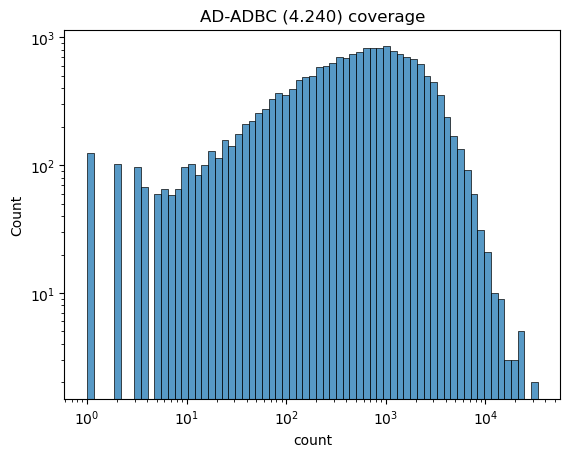

In [50]:
ax = sns.histplot(testAD, x='count', log_scale=True)
ax.set_yscale('log')
plt.title('AD-ADBC (4.240) coverage')

Text(0.5, 1.0, 'AD-ADBC (4.240) coverage')

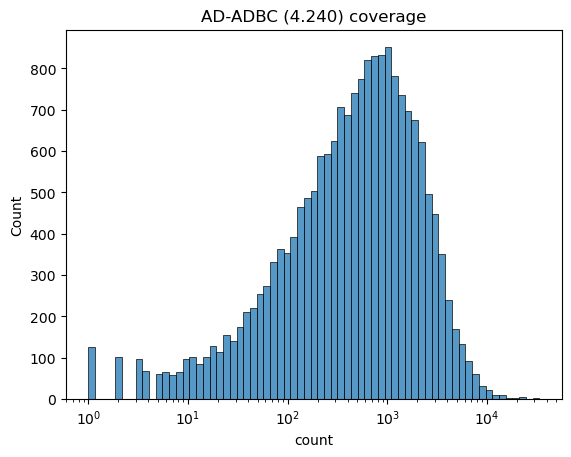

In [12]:
sns.histplot(testAD, x='count', log_scale=True)
plt.title('AD-ADBC (4.240) coverage')

In [13]:
testRPTR = RPTRexperiments_dict['RPTR_4_240']
testRPTR

,BCs,count,PutativeTileADBC,Library,Allreads
0,GGAGGGCCAACGCA,112457,['TCTCCAGATATTGATGCTTCTCCATTTATTAATGATTCATTTGA...,RPTR_4_240,29401118
1,TAGTCAGACGCAAA,85483,['TTTACTGATTTGTCTACTCCATCATTTGATTCTCCAGGTTACTT...,RPTR_4_240,29401118
2,CATTCATAAAGAAC,84480,['TTCTTCTCTTCTTCTGTTGATTCTACTCCAATGTTTGATTTGGA...,RPTR_4_240,29401118
4,ATGTCCATGACCTA,62945,['CCATCTATCTTTGATGGTTCTCCAGACTTTGATACATTTGATAT...,RPTR_4_240,29401118
5,TGGGTGTCACCCCG,59665,['ATGAATCCATCTATGCCAACTCCAACATTCTCTTCTCCATATTT...,RPTR_4_240,29401118
...,...,...,...,...,...
217893,CCAATTAAGTTGGG,1,['GATACTATTGATCCACAAAGATCTTCTTCTCCACCAGTTAATCC...,RPTR_4_240,29401118
218084,CATGAATGGAACAG,1,['GTTCCAGCTTTGGCTGCTCAATTGTTGACTGGTCATGCTGCTGA...,RPTR_4_240,29401118
218418,GCAGGAAAAAGTAA,1,['TCTATTACTCAATTTGAACAACAGAAACCAGAACCAGTTATTGC...,RPTR_4_240,29401118
220771,TCAGGTAATATATG,1,['ATGGATATTCCAGATGCTTTGTCATTTGAAGACTTTACTCCATT...,RPTR_4_240,29401118


Text(0.5, 1.0, 'RPTR BCs (4.240) coverage')

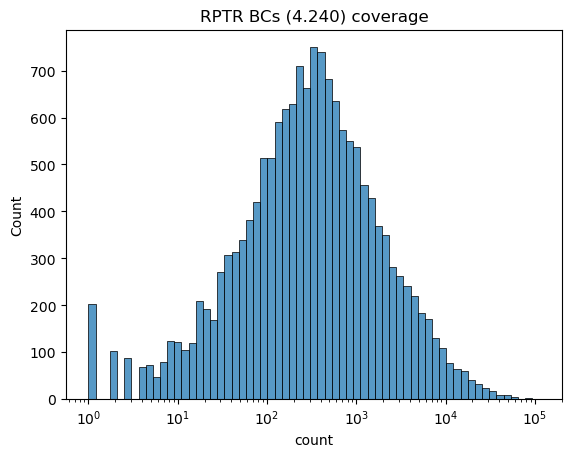

In [14]:
sns.histplot(testRPTR, x='count', log_scale=True)
plt.title('RPTR BCs (4.240) coverage')

# Step 2: Group by time & normalize by negative controls

In [15]:
t0 = []
t5 = []
t10 = []
t15 = []
t30 = []
t180 = []
t240 = []

for key in merged_dfs.keys():
    if key.endswith('_5'):
        # print(key)
        merged_dfs[key]['Library'] = key
        t5.append(merged_dfs[key])
    if key.endswith('_10'):
        # print(key)
        merged_dfs[key]['Library'] = key
        t10.append(merged_dfs[key])
    if key.endswith('_15'):
        # print(key)
        merged_dfs[key]['Library'] = key
        t15.append(merged_dfs[key])  
    if key.endswith('_30'):
        # print(key)
        merged_dfs[key]['Library'] = key
        t30.append(merged_dfs[key])
    if key.endswith('_180'):
        # print(key)
        merged_dfs[key]['Library'] = key
        t180.append(merged_dfs[key])
    if key.endswith('_240'):
        # print(key)
        merged_dfs[key]['Library'] = key
        t240.append(merged_dfs[key])      
    if key.endswith('_0'):
        # print(key)
        merged_dfs[key]['Library'] = key
        t0.append(merged_dfs[key])    
        
t5_all = pd.concat(t5, ignore_index=True)
t5_all['R_norm_rpm'] = t5_all['R_normalized']*10e6
t5_all['A_norm_rpm'] = t5_all['A_normalized']*10e6
t10_all = pd.concat(t10, ignore_index=True)
t10_all['R_norm_rpm'] = t10_all['R_normalized']*10e6
t10_all['A_norm_rpm'] = t10_all['A_normalized']*10e6
t15_all = pd.concat(t15, ignore_index=True)
t15_all['R_norm_rpm'] = t15_all['R_normalized']*10e6
t15_all['A_norm_rpm'] = t15_all['A_normalized']*10e6
t30_all = pd.concat(t30, ignore_index=True)
t30_all['R_norm_rpm'] = t30_all['R_normalized']*10e6
t30_all['A_norm_rpm'] = t30_all['A_normalized']*10e6
t180_all = pd.concat(t180, ignore_index=True)
t180_all['R_norm_rpm'] = t180_all['R_normalized']*10e6
t180_all['A_norm_rpm'] = t180_all['A_normalized']*10e6
t240_all = pd.concat(t240, ignore_index=True)
t240_all['R_norm_rpm'] = t240_all['R_normalized']*10e6
t240_all['A_norm_rpm'] = t240_all['A_normalized']*10e6
t0_all = pd.concat(t0, ignore_index=True)
t0_all['R_norm_rpm'] = t0_all['R_normalized']*10e6
t0_all['A_norm_rpm'] = t0_all['A_normalized']*10e6

# sanity check
t10_all.head()

,BCs,count_r,Allreads_r,Tile-AD,count_a,Library_a,Allreads_a,R_normalized,A_normalized,Ratio,Tile,AD,Library,R_norm_rpm,A_norm_rpm
0,CATTCATAAAGAAC,80228,26609996,TTCTTCTCTTCTTCTGTTGATTCTACTCCAATGTTTGATTTGGATG...,10471,AD_2_10,27782657,0.003015,0.000377,7.999572,TTCTTCTCTTCTTCTGTTGATTCTACTCCAATGTTTGATTTGGATG...,CCCCACCGGCC,AD_2_10,30149.572364,3768.897986
1,GGAGGGCCAACGCA,71949,26609996,TCTCCAGATATTGATGCTTCTCCATTTATTAATGATTCATTTGAAA...,9365,AD_2_10,27782657,0.002704,0.000337,8.021322,TCTCCAGATATTGATGCTTCTCCATTTATTAATGATTCATTTGAAA...,TTCCTCACAGG,AD_2_10,27038.335519,3370.807911
2,ATGTCCATGACCTA,65504,26609996,CCATCTATCTTTGATGGTTCTCCAGACTTTGATACATTTGATATTT...,4598,AD_2_10,27782657,0.002462,0.000165,14.874002,CCATCTATCTTTGATGGTTCTCCAGACTTTGATACATTTGATATTT...,TTGGCACGACG,AD_2_10,24616.313358,1654.989298
3,TAGTCAGACGCAAA,62154,26609996,TTTACTGATTTGTCTACTCCATCATTTGATTCTCCAGGTTACTTCT...,13025,AD_2_10,27782657,0.002336,0.000469,4.982190,TTTACTGATTTGTCTACTCCATCATTTGATTCTCCAGGTTACTTCT...,GTTATGTGACA,AD_2_10,23357.387953,4688.176512
4,TATCCCATTCCGAC,59075,26609996,CCATCTATCTTTGATTCTCCAGATGTTGCTGAATCATTTGAAACTT...,7058,AD_2_10,27782657,0.002220,0.000254,8.738785,CCATCTATCTTTGATTCTCCAGATGTTGCTGAATCATTTGAAACTT...,TGTGATAAACT,AD_2_10,22200.303976,2540.433768


In [16]:
time_df_list = [t0_all, t5_all, t10_all, t15_all, t30_all, t180_all, t240_all]

In [17]:
# list of all negative controls
neg_controls_df = pd.read_csv('/global/scratch/projects/fc_mvslab/OpenProjects/EChase/TREBLEseq_ismaybethenewcibername/TREBLseq_finaldrafts/neg_controls.csv', usecols=['DNAseq'])
neg_controls = neg_controls_df['DNAseq'].to_list()

for df in time_df_list:
    neg_control_mean = df[df['Tile'].isin(neg_controls)]['Ratio'].mean()
    df['Ratio_negCTRLnorm'] = df['Ratio']/neg_control_mean

concatenated_df = pd.concat(time_df_list, ignore_index=True)
concatenated_df['Time'] = concatenated_df['Library_a'].str.split('_').str[-1]
concatenated_df['Time'] = pd.to_numeric(concatenated_df['Time'])
concatenated_df['sample'] = concatenated_df['Library_a'].str.split('_').str[-2]
concatenated_df.head()

,BCs,count_r,Allreads_r,Tile-AD,count_a,Library_a,Allreads_a,R_normalized,A_normalized,Ratio,Tile,AD,Library,R_norm_rpm,A_norm_rpm,Ratio_negCTRLnorm,Time,sample
0,GGAGGGGTCAGAAG,30178,25023784,TCTTCTTCATTTGGTTTGTCTGGTAATTCTTCTCAACATAGATTGT...,21180,AD_3_0,32971640,0.001206,0.000642,1.877379,TCTTCTTCATTTGGTTTGTCTGGTAATTCTTCTCAACATAGATTGT...,CGCGGCTACAA,AD_3_0,12059.726858,6423.702309,2.215195,0,3
1,CCCCAGACTCGTTG,20130,25023784,AGACCAGCTAGACCACCAGTTCCATTGTTCTCTCAATCTACTGGTT...,36030,AD_3_0,32971640,0.000804,0.001093,0.736151,AGACCAGCTAGACCACCAGTTCCATTGTTCTCTCAATCTACTGGTT...,TCCTAAGCTCG,AD_3_0,8044.346930,10927.572908,0.868614,0,3
2,TTAAACCTTCGTCG,17807,25023784,CAAGGTGAACCAATGTTAAATTCTTCTAATGATTGGTTCTCTTTGT...,21205,AD_3_0,32971640,0.000712,0.000643,1.106471,CAAGGTGAACCAATGTTAAATTCTTCTAATGATTGGTTCTCTTTGT...,GTCCGTAGGGA,AD_3_0,7116.030094,6431.284583,1.305569,0,3
3,TATGTTGTAGCTTA,17336,25023784,TTGGGTGTTATTACTTATAATAGGAAACAAAGAGCTACTCCATTGA...,26415,AD_3_0,32971640,0.000693,0.000801,0.864741,TTGGGTGTTATTACTTATAATAGGAAACAAAGAGCTACTCCATTGA...,CTACGGAACTC,AD_3_0,6927.809159,8011.430429,1.020342,0,3
4,TGGCTACCAAACAA,15459,25023784,GTTGAATCTATGTCTGCTCCACCATCTGGTGCTTATACTGATTTGA...,18042,AD_3_0,32971640,0.000618,0.000547,1.128975,GTTGAATCTATGTCTGCTCCACCATCTGGTGCTTATACTGATTTGA...,TCATTATGAGC,AD_3_0,6177.722762,5471.975310,1.332122,0,3


In [18]:
# checkpoint:
# concatenated_df.to_csv('rawdata_normalized_<date>.csv')

# Step 2.1: Activity score QC

In [21]:
# read in facs csv with activity data and control designation (EC did by hand in excel)
facs_f='/global/scratch/projects/fc_mvslab/OpenProjects/EChase/TREBLEseq_ismaybethenewcibername/TREBLseq_finaldrafts/Gcn4OrthologData_ToShare_20240930_EC.csv'
facsdf_qc = pd.read_csv(facs_f, usecols=['Name','ArrayDNA','is_control',
                                         'Activity_SCglucose', 'TotalReads_BioRepA_BYS4', 'TotalReads_BioRepB_BYS4',
                                         'BioRep_A_mCherry','BioRep_A_mCherry_TotalReads','BioRep_B_mCherry','BioRep_B_mCherry_TotalReads', #mCherry 4 bin sorts
                                        'BioRep_A_GFP', 'BioRep_A_GFP_TotalReads','BioRep_B_GFP', 'BioRep_B_GFP_TotalReads', #GFP 4 bin sorts -- one of the replicates is very messed up
                                        ])

facsdf_qc['GFP_mean']=facsdf_qc[['BioRep_A_GFP','BioRep_B_GFP']].mean(axis=1)
facsdf_qc['mCherry_mean']=facsdf_qc[['BioRep_A_mCherry','BioRep_B_mCherry']].mean(axis=1)
facsdf_qc = facsdf_qc[(
    facsdf_qc['BioRep_A_mCherry_TotalReads']>=50) & (facsdf_qc['BioRep_B_mCherry_TotalReads']>=50) &(
        facsdf_qc['BioRep_A_GFP_TotalReads']>=50) & (facsdf_qc['BioRep_B_GFP_TotalReads']>=50)
    ]
facsdf_qc = facsdf_qc[(facsdf_qc['TotalReads_BioRepA_BYS4']>=1000) & (facsdf_qc['TotalReads_BioRepB_BYS4']>=1000) ]
facsdf_qc

,Name,is_control,ArrayDNA,TotalReads_BioRepA_BYS4,TotalReads_BioRepB_BYS4,BioRep_A_GFP_TotalReads,BioRep_A_GFP,BioRep_B_GFP_TotalReads,BioRep_B_GFP,BioRep_A_mCherry_TotalReads,BioRep_A_mCherry,BioRep_B_mCherry_TotalReads,BioRep_B_mCherry,Activity_SCglucose,GFP_mean,mCherry_mean
7,Sordariomycetes_jgi|Acral2|2019554|gm1.4974_g_36,experimental,GCTTCTGGTCAAGCTAATGCTAATTATCAAGCATTTACTGCTGGTT...,37745.0,27242.0,555.0,1069.575624,294.0,256.000000,1301.0,1914.455499,819.0,2495.171715,31637.986095,662.787812,2204.813607
8,Sordariomycetes_jgi|Acral2|2019554|gm1.4974_g_41,experimental,AATGCTAATTATCAAGCATTTACTGCTGGTTCTGCTTTGAATGGTC...,54447.0,34378.0,521.0,648.717628,569.0,268.428420,2706.0,1863.229267,716.0,1873.407563,35182.012737,458.573024,1868.318415
9,Sordariomycetes_jgi|Acral2|2019554|gm1.4974_g_46,experimental,GCATTTACTGCTGGTTCTGCTTTGAATGGTCCATCTTTGCCAGCTC...,53756.0,5256.0,784.0,1186.811484,64.0,256.000000,2109.0,1028.931403,80.0,855.631328,65569.941168,721.405742,942.281366
10,Sordariomycetes_jgi|Acral2|2019554|gm1.4974_g_51,experimental,TCTGCTTTGAATGGTCCATCTTTGCCAGCTCCATCTTTGTTTGCTG...,6275.0,86566.0,58.0,2912.584135,1438.0,598.087653,333.0,596.539632,4863.0,1520.385633,41694.074991,1755.335894,1058.462632
11,Sordariomycetes_jgi|Acral2|2019554|gm1.4974_g_56,experimental,CCATCTTTGCCAGCTCCATCTTTGTTTGCTGGTCATGGTCCAGAAG...,19935.0,4774.0,479.0,361.582465,141.0,256.000000,1673.0,3213.641420,524.0,3169.107634,18947.873984,308.791233,3191.374527
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20813,Gnc4Lib_Disorder_HIGH_0,high,TCTACTGATTATACTCCAATGTTTGAATATGAAACTTATGAAGATA...,3225.0,23456.0,414.0,8782.000000,2446.0,9064.000000,94.0,1664.822094,479.0,1331.972632,261410.705323,8923.000000,1498.397363
20814,Gnc4Lib_Disorder_HIGH_0,high,ATGACTGATTCTACTCCAATGTTTGAATATGAATTGACTGAGAATA...,64713.0,46036.0,10295.0,4506.455793,8034.0,5156.528478,2549.0,3124.915008,1258.0,2875.423105,152798.870307,4831.492136,3000.169056
20818,Gnc4Lib_Charge_HIGH_0,mid,TCTACTGATTCTACTCCAATGTTTGAATATCAGAATTTGGAGAATA...,4430.0,53110.0,452.0,3363.151895,7755.0,3243.398807,124.0,1860.267447,2115.0,1947.655400,113197.558297,3303.275351,1903.961424
20820,Gnc4Lib_Disorder_HIGH_0,high,TCTACTGATTATACTCCAATGTTTGAATATGAAACTTATGAAGATA...,3225.0,23456.0,414.0,8782.000000,2446.0,9064.000000,94.0,1664.822094,479.0,1331.972632,261410.705323,8923.000000,1498.397363


In [22]:
def corrfunc_pair(x, y, **kws):
    # Drop NaNs
    mask = ~np.isnan(x) & ~np.isnan(y)
    
    # Filter to only positive values for log transformation
    positive_mask = mask & (x > 0) & (y > 0)

    if np.sum(positive_mask) == 0:
        spearman_r = 0
        pearson_r = 0
    else:
        # Log-transform the values
        x_log = np.log10(x[positive_mask])
        y_log = np.log10(y[positive_mask])

        # Compute Spearman correlation on raw (non-log) data
        spearman_r, _ = spearmanr(x[positive_mask], y[positive_mask])
        # Compute Pearson correlation on log-transformed data
        pearson_r, _ = pearsonr(x_log, y_log)

    # Plot annotations
    ax = plt.gca()
    ax.annotate(
        f'Spearman r = {spearman_r:.2f}\nPearson r (log10) = {pearson_r:.2f}',
        xy=(0.5, 0.1), 
        xycoords=ax.transAxes, 
        ha='center', 
        fontsize=12
    )


In [24]:
# inner join the df's 
qcdf = pd.merge(concatenated_df[['Tile', 'AD', 'BCs', 
                                 'R_norm_rpm', 'A_norm_rpm',
                                 'Ratio_negCTRLnorm', 'Time','sample'
                                ]], 
                facsdf_qc[['Name', 'ArrayDNA', 'is_control',
                                           'GFP_mean', 'mCherry_mean', 'Activity_SCglucose']],
                   left_on = 'Tile', right_on = 'ArrayDNA',
                   how= 'inner')
qcdf = qcdf.drop(columns=['ArrayDNA', ])
qcdf.head()

,Tile,AD,BCs,R_norm_rpm,A_norm_rpm,Ratio_negCTRLnorm,Time,sample,Name,is_control,GFP_mean,mCherry_mean,Activity_SCglucose
0,AGACCAGCTAGACCACCAGTTCCATTGTTCTCTCAATCTACTGGTT...,TCCTAAGCTCG,CCCCAGACTCGTTG,8044.346930,10927.572908,0.868614,0,3,Sordariomycetes_jgi|Ilyeu1|617022|fgenesh1_pg....,experimental,890.800326,1993.033151,28683.457979
1,CCATCTTTGGGTCAAGGTTCTGAGAATTTGTCTCCATCTACTGCTT...,GTCCAATCGAG,AGCTCGGTTGATAT,6007.085100,7583.790191,0.934625,0,3,Leotiomycetes_jgi|Amore1|51693|fgenesh1_pm.8_#...,experimental,1289.431514,3733.621095,23828.786765
2,GAATTGGAAGTTTCTGAAGCTTTGAGAACTTCTGCTTCTGGTACTA...,CTTGCTTTGCG,CTATGCACGGGACA,4417.397465,5091.648459,1.023689,0,3,Leotiomycetes_jgi|Oidma1|18868|fgenesh1_kg.6_#...,experimental,303.024116,3282.238422,17458.495425
3,TTTACTGATTTGTCTACTCCATCATTTGATTCTCCAGGTTACTTCT...,GTTATGTGACA,TAGTCAGACGCAAA,3796.388268,4927.264765,0.909127,0,3,Eurotiomycetes_jgi|Aspwest1|288254|MIX3379_623...,experimental,7374.472922,2207.180654,249515.405442
4,GCTGATTCATTCTTGCCAACTCCAATTATGGAGAATGCTAAATTGT...,TTTCGATCCCG,TAGTCACCTCTGTT,3692.087496,3241.876959,1.343802,0,3,Tbla_TBLA0A00980_271,experimental,671.685866,1278.286027,48335.239772


In [25]:
qcdf3_180 = qcdf[(qcdf['sample']=='3') & (qcdf['Time']==180)]
qcdf3_180

,Tile,AD,BCs,R_norm_rpm,A_norm_rpm,Ratio_negCTRLnorm,Time,sample,Name,is_control,GFP_mean,mCherry_mean,Activity_SCglucose
79211,TTTACTGATTTGTCTACTCCATCATTTGATTCTCCAGGTTACTTCT...,GTTATGTGACA,TAGTCAGACGCAAA,28327.502548,5630.468315,20.920883,180,3,Eurotiomycetes_jgi|Aspwest1|288254|MIX3379_623...,experimental,7374.472922,2207.180654,249515.405442
79212,CCATCTATCTTTGATGGTTCTCCAGACTTTGATACATTTGATATTT...,TTGGCACGACG,ATGTCCATGACCTA,20240.604288,1779.889243,47.287542,180,3,Sordariomycetes_jgi|Gelte1|412576|gw1.5.2568.1_71,experimental,8833.905291,1522.480573,261863.349904
79213,GCTCCATCTAATTTGGACTTTGACTTTACTTTGCCACAAACTGTTA...,TATCTTTTTCG,TGTACTCATTGGAG,19262.976540,4013.680271,19.957074,180,3,Skud_5.91_61,experimental,6663.514250,2094.954229,207942.589515
79214,CCATCTATCTTTGATTCTCCAGATGTTGCTGAATCATTTGAAACTT...,TGTGATAAACT,TATCCCATTCCGAC,18166.494540,2887.144085,26.164890,180,3,Xylonomycetes_jgi|Xylhe1|264767|gm1.473_g_1081,experimental,8307.761611,2346.491819,239541.345705
79215,TTGACTTCTCCAGATATTGATGCTTCTCCATTTATTAATGATTCAT...,ACCGCCTCGGC,ATACCCGAACGAGT,17407.338769,1067.427806,67.812556,180,3,Dothideomycetes_jgi|Epini1|466314|gm1.4452_g_216,experimental,8488.851766,3123.578343,260806.140917
...,...,...,...,...,...,...,...,...,...,...,...,...,...
84478,AGAGTTGCTCAAATCTTGCAAGCTATTGGTCATCCAGCTTTGTCTT...,AAGAATTATGA,GAGGCCCCGGCCGC,3.435094,30.028321,0.475690,180,3,Sordariomycetes_jgi|Trici4|1123710|e_gw1.10.67...,experimental,392.017835,2937.273757,17226.244256
84479,ACTGTTACTCCATTGCAATTGCATTCTTCTATTGTTGAATCTGTCT...,AACCTACTTTG,CCAGCATGCCTCAT,3.435094,7.270015,1.964806,180,3,Saccharomycotina_jgi|Wican1|37412|estExt_Genew...,experimental,5624.331879,2770.627369,179197.487641
84480,AGACAAACTGACTTTGTCTTGTATGATCAACCAGCTCAAGTTCCAC...,AGGCTAGTATT,AACAAACTAATAGT,3.435094,20.545694,0.695239,180,3,Dothideomycetes_jgi|Settur3|528825|fgenesh1_pg...,experimental,605.711178,2971.379025,20069.377262
84481,AGAAGATCTAGAGCTAGGAAATTGCAAAGAATGAAACAATTGGAAG...,CTACTCGATGG,ACATGGGCTCAGAG,3.435094,9.482628,1.506351,180,3,Skud_5.91_241,experimental,410.727701,2367.144406,31865.515137


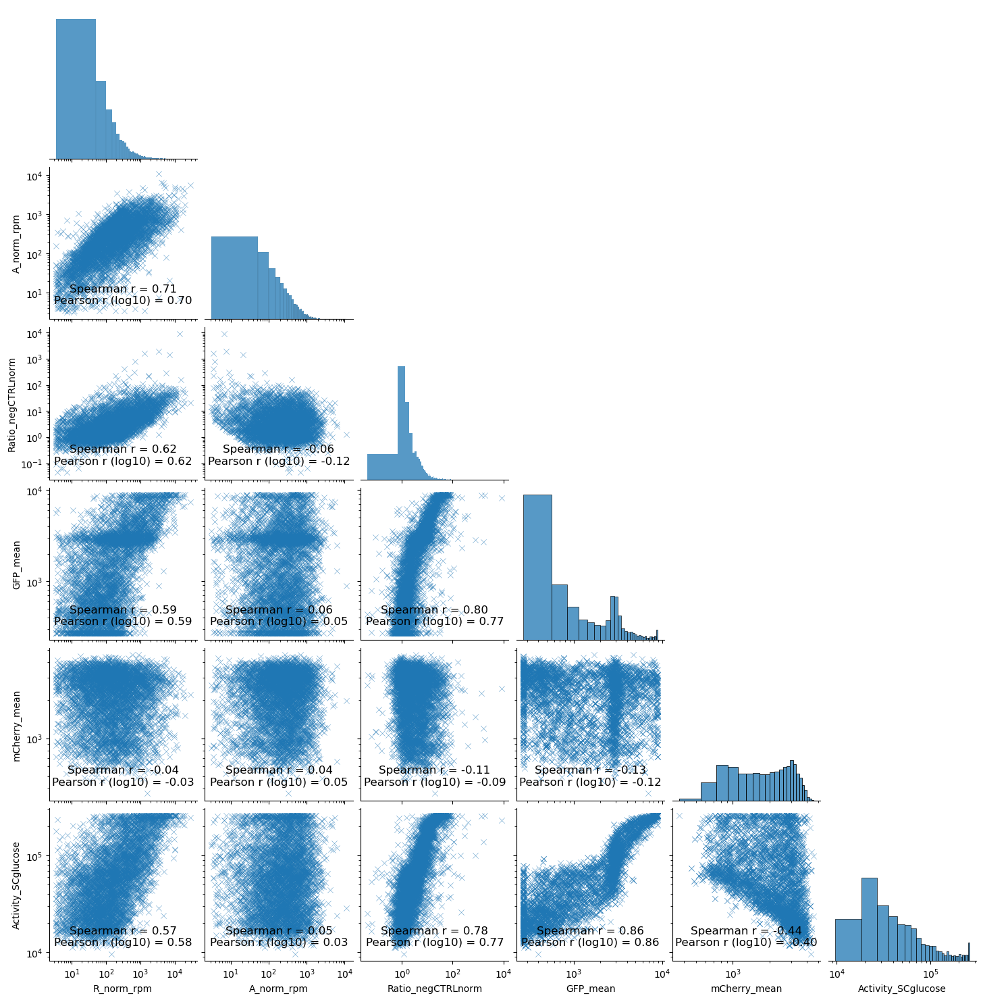

In [26]:
p = sns.pairplot(qcdf3_180.drop(columns=['Time', 'sample']), plot_kws={"marker": "x", "alpha": 0.6}, corner=True)
p.set(xscale="log", yscale="log")
p.map_lower(corrfunc_pair)
#plt.savefig('sortseq_v_treblseqUMI_<date>.pdf')
plt.show()

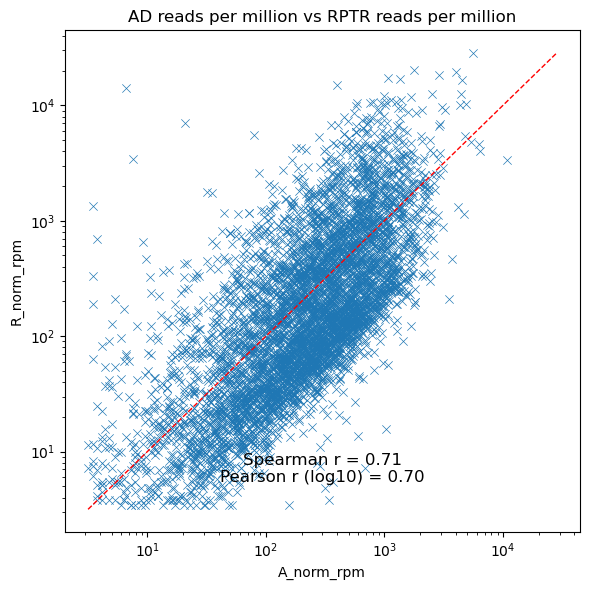

In [27]:
x = qcdf3_180['A_norm_rpm']
y = qcdf3_180['R_norm_rpm']

plt.figure(figsize=(6,6))
sns.scatterplot(data=qcdf3_180, x='A_norm_rpm', y='R_norm_rpm', marker='x')

plt.xscale('log')
plt.yscale('log')

# Add y = x line
min_val = max(min(x.min(), y.min()), 1e-3)  # avoid log(0)
max_val = max(x.max(), y.max())
plt.plot([min_val, max_val], [min_val, max_val], color='red', linestyle='--', linewidth=1)

# Add title
plt.title('AD reads per million vs RPTR reads per million')

# Add correlation text
corrfunc_pair(x.values, y.values)

plt.tight_layout()
#plt.savefig('ADreads_vs_RPTRreads_<date>.pdf')
plt.show()

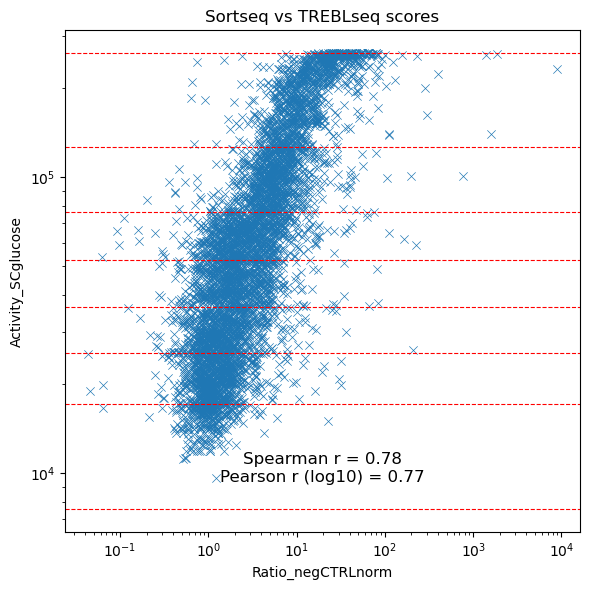

In [28]:
# Values to plot as horizontal lines: medians for the ratio sort bins
bin_medians = [7575.5, 17142.5, 25459.0, 36406.0, 52364.0, 76287.0, 126676.0, 262143.0]

# Plot
x = qcdf3_180['Ratio_negCTRLnorm']
y = qcdf3_180['Activity_SCglucose']

plt.figure(figsize=(6,6))
sns.scatterplot(data=qcdf3_180, y='Activity_SCglucose', x='Ratio_negCTRLnorm', marker='x')

plt.xscale('log')
plt.yscale('log')

# Add horizontal lines
for y_val in bin_medians:
    plt.axhline(y=y_val, color='red', linestyle='--', linewidth=0.8)

# Title and annotation
plt.title('Sortseq vs TREBLseq scores')
corrfunc_pair(x.values, y.values)

plt.tight_layout()
#plt.savefig('sortseq_vs_TREBLseq_<date>.pdf')
plt.show()

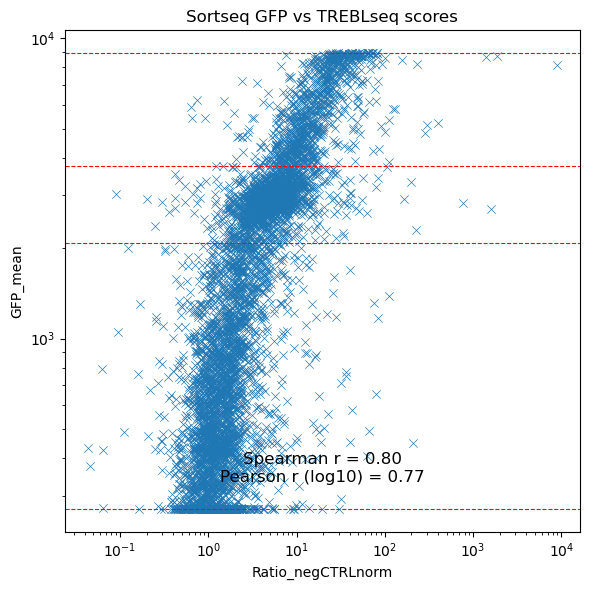

In [31]:
# Values to plot as horizontal lines: medians for the GFP sort bins
BYS4_1AGFP = [285,2109,3769,8782]
BYS4_4BGFP = [256,2068,3724,9064]
GFP_bin_medians = [sum(vals) / len(vals) for vals in zip(BYS4_1AGFP, BYS4_4BGFP)]

# Plot
x = qcdf3_180['Ratio_negCTRLnorm']
y = qcdf3_180['GFP_mean']

plt.figure(figsize=(6,6))
sns.scatterplot(data=qcdf3_180, y='GFP_mean', x='Ratio_negCTRLnorm', marker='x')

plt.xscale('log')
plt.yscale('log')

# Add horizontal lines
for y_val in GFP_bin_medians:
    plt.axhline(y=y_val, color='red', linestyle='--', linewidth=0.8)

# Title and annotation
plt.title('Sortseq GFP vs TREBLseq scores')
corrfunc_pair(x.values, y.values)

plt.tight_layout()
plt.show()

# Step 3: Generate traces

In [34]:
# read in facs csv with activity data and control designation (EC did by hand in excel)
facs_f='/global/scratch/projects/fc_mvslab/OpenProjects/EChase/TREBLEseq_ismaybethenewcibername/TREBLseq_finaldrafts/Gcn4OrthologData_ToShare_20240930_EC.csv'
facsdf = pd.read_csv(facs_f, usecols=['Name','ArrayDNA','is_control','Activity_SCglucose']).dropna()

# inner join the df's 
intersectiondf = pd.merge(concatenated_df, facsdf,
                   left_on = 'Tile', right_on = 'ArrayDNA',
                   how= 'inner')
intersectiondf = intersectiondf.drop(columns=['ArrayDNA', ])
intersectiondf.head()

,BCs,count_r,Allreads_r,Tile-AD,count_a,Library_a,Allreads_a,R_normalized,A_normalized,Ratio,...,AD,Library,R_norm_rpm,A_norm_rpm,Ratio_negCTRLnorm,Time,sample,Name,is_control,Activity_SCglucose
0,GGAGGGGTCAGAAG,30178,25023784,TCTTCTTCATTTGGTTTGTCTGGTAATTCTTCTCAACATAGATTGT...,21180,AD_3_0,32971640,0.001206,0.000642,1.877379,...,CGCGGCTACAA,AD_3_0,12059.726858,6423.702309,2.215195,0,3,Xylonomycetes_jgi|Xylhe1|264767|gm1.473_g_956,experimental,43649.492954
1,CCCCAGACTCGTTG,20130,25023784,AGACCAGCTAGACCACCAGTTCCATTGTTCTCTCAATCTACTGGTT...,36030,AD_3_0,32971640,0.000804,0.001093,0.736151,...,TCCTAAGCTCG,AD_3_0,8044.346930,10927.572908,0.868614,0,3,Sordariomycetes_jgi|Ilyeu1|617022|fgenesh1_pg....,experimental,28683.457979
2,TTAAACCTTCGTCG,17807,25023784,CAAGGTGAACCAATGTTAAATTCTTCTAATGATTGGTTCTCTTTGT...,21205,AD_3_0,32971640,0.000712,0.000643,1.106471,...,GTCCGTAGGGA,AD_3_0,7116.030094,6431.284583,1.305569,0,3,Dothideomycetes_jgi|Epini1|455912|estExt_fgene...,experimental,192507.809213
3,TATGTTGTAGCTTA,17336,25023784,TTGGGTGTTATTACTTATAATAGGAAACAAAGAGCTACTCCATTGA...,26415,AD_3_0,32971640,0.000693,0.000801,0.864741,...,CTACGGAACTC,AD_3_0,6927.809159,8011.430429,1.020342,0,3,Agos_ADL012C_236,experimental,31683.971063
4,TGGCTACCAAACAA,15459,25023784,GTTGAATCTATGTCTGCTCCACCATCTGGTGCTTATACTGATTTGA...,18042,AD_3_0,32971640,0.000618,0.000547,1.128975,...,TCATTATGAGC,AD_3_0,6177.722762,5471.975310,1.332122,0,3,Lecanoromycetes_jgi|Usnflo1|684003|CE684002_60...,experimental,81490.328392


In [35]:
# Define a function to remove outliers using the IQR method for each time group
def remove_outliers(df, group_col, target_col):
    """
    Distribution is non-parametric (skewed to the left, see lab notebook November 19, 2024), so we will keep the IQR method for calculating outliers
    """
    def filter_outliers(group):
        q1 = group[target_col].quantile(0.25) #finding IQR
        q3 = group[target_col].quantile(0.75)
        iqr = q3 - q1
        lower_bound = q1 - 1.5 * iqr # establish bounds of IQR
        upper_bound = q3 + 1.5 * iqr
        return group[(group[target_col] >= lower_bound) & (group[target_col] <= upper_bound)] # for a group return only those that are within IQR

    return df.groupby(group_col, group_keys=False)[list(set(['Tile','sample','Name', target_col, 'Time', 'BCs', 'A_norm_rpm', 'R_norm_rpm', 'Ratio']))].apply(filter_outliers) # group by a column, find IQR, return non-outliers

In [36]:
# Notes: 
# 1. You might have to change the sample names here* (see below) based on what you called them when you gave them names in the 'Library' Column earlier.
# 2. Or, if you've saved/re-read in the intersection df from csv, you'll want those to be int types not string type
# 3. We gotta fix the barcodes at some point but

def tile_and_replicate_hillfxn(tile, scoretype, outliers_removed=True, save_fig=False):
    """
    Generate subplots for:
    1. Ratio vs. Time for a single sample, showing individual replicates (BCs) with their mean and standard deviation.
    2. Ratio vs. Time for multiple samples, showing individual sample lines with overall mean and standard deviation.
    
    Parameters:
    tile (str): The tile to plot.
    scoretype (str): Column that you want to run the time analysis
    outliers_removed (bool): Whether to remove outliers (based on IQR).
    save_fig (bool): save the figure as the tile name
    """
    tiledf = intersectiondf.copy(deep=True)
    single_sample_df2 = tiledf[(tiledf['Tile'] == tile) & (tiledf['sample'] == '2')] # Here *
    single_sample_df3 = tiledf[(tiledf['Tile'] == tile) & (tiledf['sample'] == '3')] # Here *
    single_sample_df4 = tiledf[(tiledf['Tile'] == tile) & (tiledf['sample'] == '4')] # Here *
    
    all_samples_df = tiledf[tiledf['Tile'] == tile]
    tile_name = next(iter(set(all_samples_df['Name'].to_list())))
    tile_name = "_".join(tile_name.split("|")[:3])
    
    if outliers_removed:
        single_sample_df2 = remove_outliers(single_sample_df2, group_col='Time', target_col=scoretype)
        single_sample_df3 = remove_outliers(single_sample_df3, group_col='Time', target_col=scoretype)
        single_sample_df4 = remove_outliers(single_sample_df4, group_col='Time', target_col=scoretype)
        all_samples_df = remove_outliers(all_samples_df, group_col='Time', target_col=scoretype)
    
    replicate_means2 = single_sample_df2.groupby(['Time', 'BCs'])[scoretype].mean().reset_index()
    replicate_means3 = single_sample_df3.groupby(['Time', 'BCs'])[scoretype].mean().reset_index()
    replicate_means4 = single_sample_df4.groupby(['Time', 'BCs'])[scoretype].mean().reset_index()
    
    single_time_means2 = single_sample_df2.groupby('Time')[scoretype].agg(['mean', 'std']).reset_index()
    single_time_means3 = single_sample_df3.groupby('Time')[scoretype].agg(['mean', 'std']).reset_index()
    single_time_means4 = single_sample_df4.groupby('Time')[scoretype].agg(['mean', 'std']).reset_index()
    
    sample_means = all_samples_df.groupby(['Time', 'sample'])[scoretype].mean().reset_index()
    all_time_means = sample_means.groupby('Time')[scoretype].agg(['mean', 'std']).reset_index()
    
    unique_bcs = intersectiondf['BCs'].unique()
    palette = sns.color_palette("tab20", len(unique_bcs))
    bc_color_map = dict(zip(unique_bcs, palette))
    
    fig, axes = plt.subplots(4, 1, figsize=(12, 14), sharex=True)
    fig.suptitle(f'Tile {tile_name}: Ratio (normalized) vs. Time', fontsize=16, fontweight='bold')
    
    for i, (replicate_means, single_time_means, title, ax) in enumerate(
        zip([replicate_means2, replicate_means3, replicate_means4],
            [single_time_means2, single_time_means3, single_time_means4],
            ['Single Sample (Sample 1)', 'Single Sample (Sample 2)', 'Single Sample (Sample 3)'],
            axes[:3])
    ):
        sns.lineplot(data=replicate_means, x='Time', y=scoretype, hue='BCs', ax=ax, alpha=0.6, lw=1.5, palette=bc_color_map)
        ax.errorbar(single_time_means['Time'], single_time_means['mean'], yerr=single_time_means['std'], fmt='o-', capsize=5, capthick=2, color='black', label='Overall Mean ± Std Dev', lw=2, alpha=0.7)
        ax.set_title(title)
        ax.set_ylabel(f'{scoretype}')
        ax.set_xlabel('Time (min)')
        ax.legend(title='Replicates', bbox_to_anchor=(1.05, 1), loc='upper left')
        ax.grid(True, linestyle='--', alpha=0.3)
    
    sns.lineplot(data=sample_means, x='Time', y=scoretype, hue='sample', ax=axes[3], palette='viridis', alpha=0.85, lw=1.5)
    axes[3].errorbar(all_time_means['Time'], all_time_means['mean'], yerr=all_time_means['std'], fmt='o-', capsize=5, capthick=2, color='red', label='Overall Mean ± Std Dev', lw=2, alpha=0.5)
    axes[3].set_title('All Samples')
    axes[3].set_ylabel(f'{scoretype}')
    axes[3].set_xlabel('Time (min)')
    axes[3].legend(title='Sample', bbox_to_anchor=(1.05, 1), loc='upper left')
    axes[3].grid(True, linestyle='--', alpha=0.3)
    
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    if save_fig:
        plt.savefig(f'{tile_name}_{scoretype}_timeseries.pdf')
    plt.show()
    
    return tile_name, all_time_means['mean']


ACTTCTCCATCTACTAGATCTGTTACTAAACCATCTACTGTTGCTGGTGTTAATGCTAGACAAAGGAAACCATTGCCACCAATTAAATTTGATTCTCAAGATCCAGTTGCTATGAAGAGA


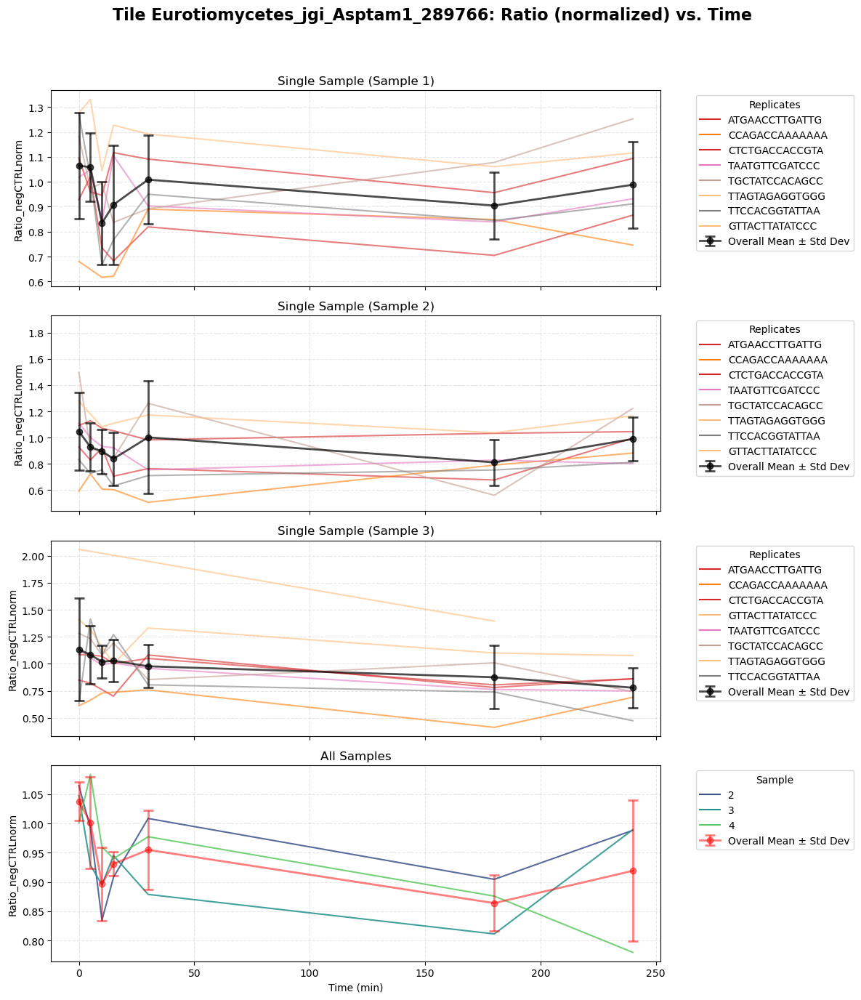

CCAGACTTTCCACCATATCATTCTACTCAATCTCCAAGATCTGCTCATTTGCCAGTTGATTTGAACTTCTCTCCAGCTTTGTCTTCATTCTCTACTTCTTCTTTGCAAACTGCTAATATT


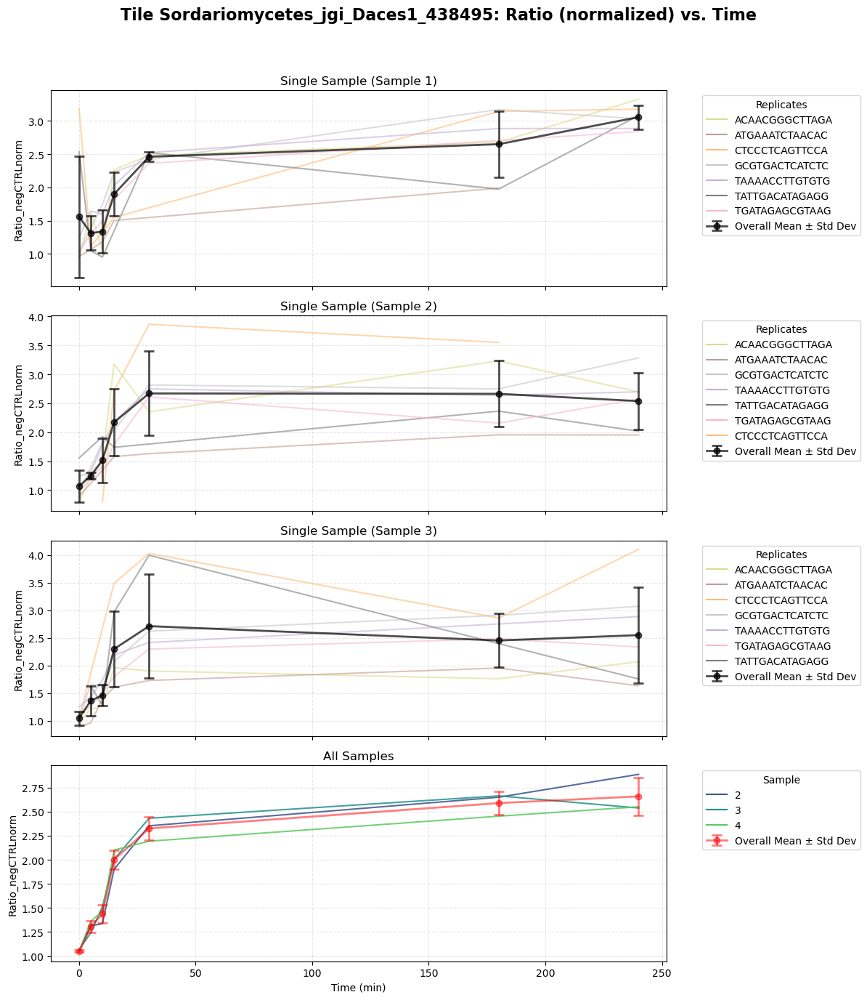

GTTAAGATTTCTTCTCAACAAACTAATTTGTTTCCAACTCAACCACCATTTGCTTCTGCTTTGCCAGAGAAAGTTGATTTGAACTTTGGTCATCAATTGCATTCATTTGGTTCTTCTTCT


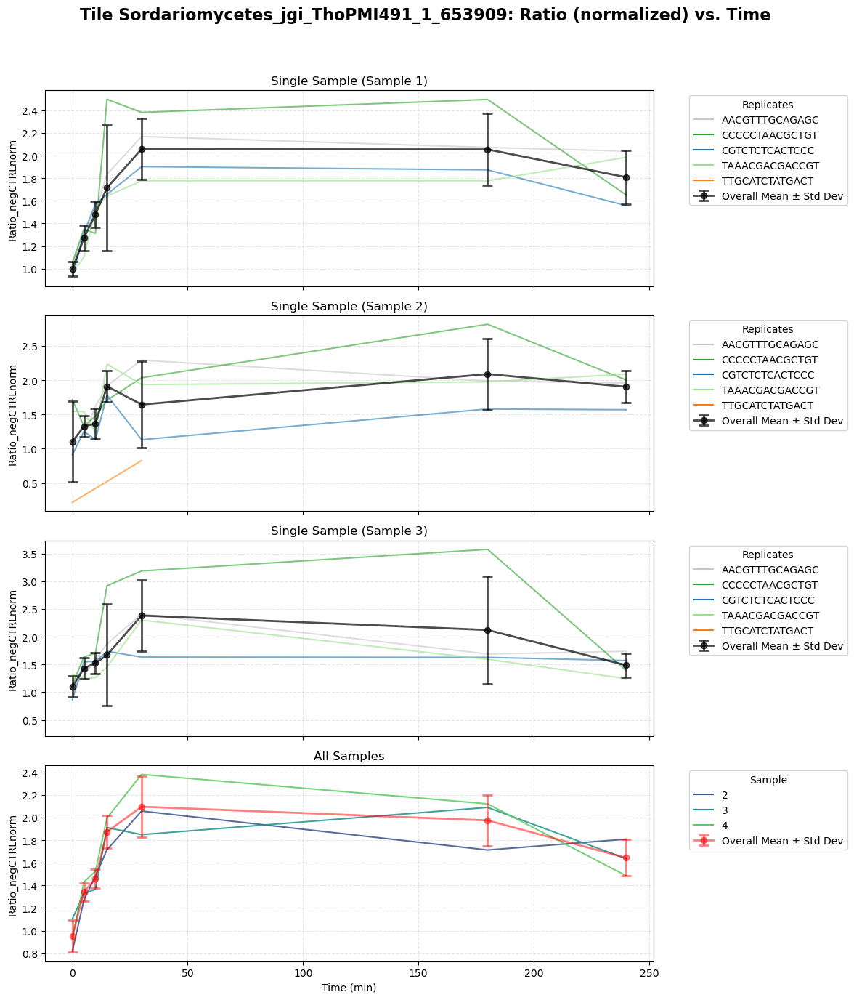

TCTGCTGATTATTCTGGTTTGCAATCTGATTATTCTCCATTGACTGGTGTTCATGATACTTCTTCTCCATCTATTGGTCCAACTATTTCTCCAAGAGAATTGTTGATGAATCCACCAACT


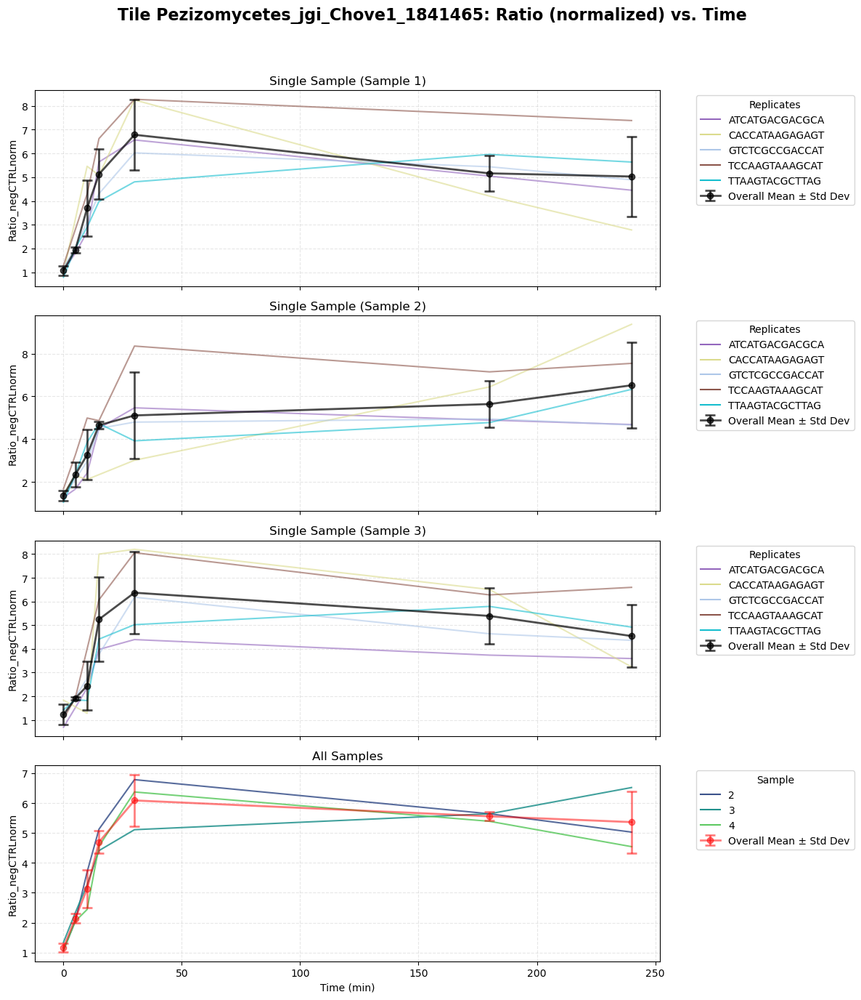

TTGGCTTCTGATTCTTTGCCACCATTGCCACCAACTCCAAGATCTCCAGCTGTTGCTCACTTTGATGGTACTTCTGCTCATGATAATCAAATTTCATTTGATGATCCAGTCTTGTTTCCA


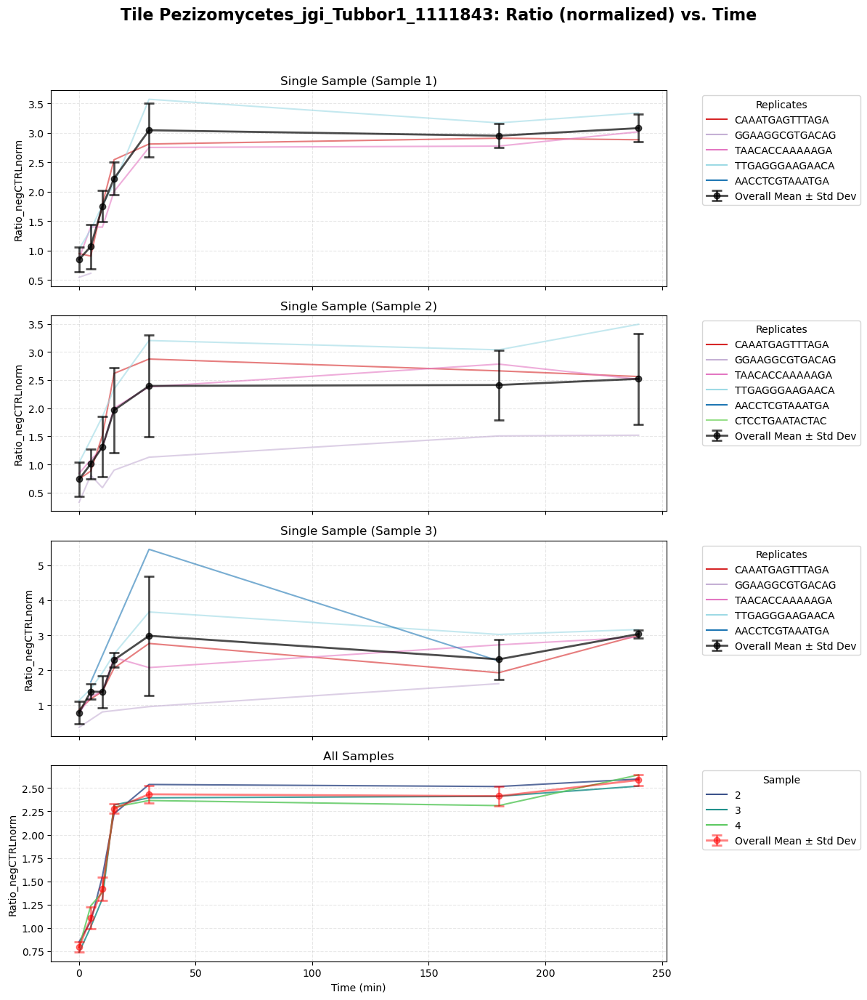

GATTCTCCATATGGTGATTCTTATGATGTTTCTCCAAACTTTGGTGGTAATGACTTTGAAGCTGGTGCTCATGATACTTGGTTTCCATTGTTTGCTCAAGATACTTCTGTTGCTGCTGGT


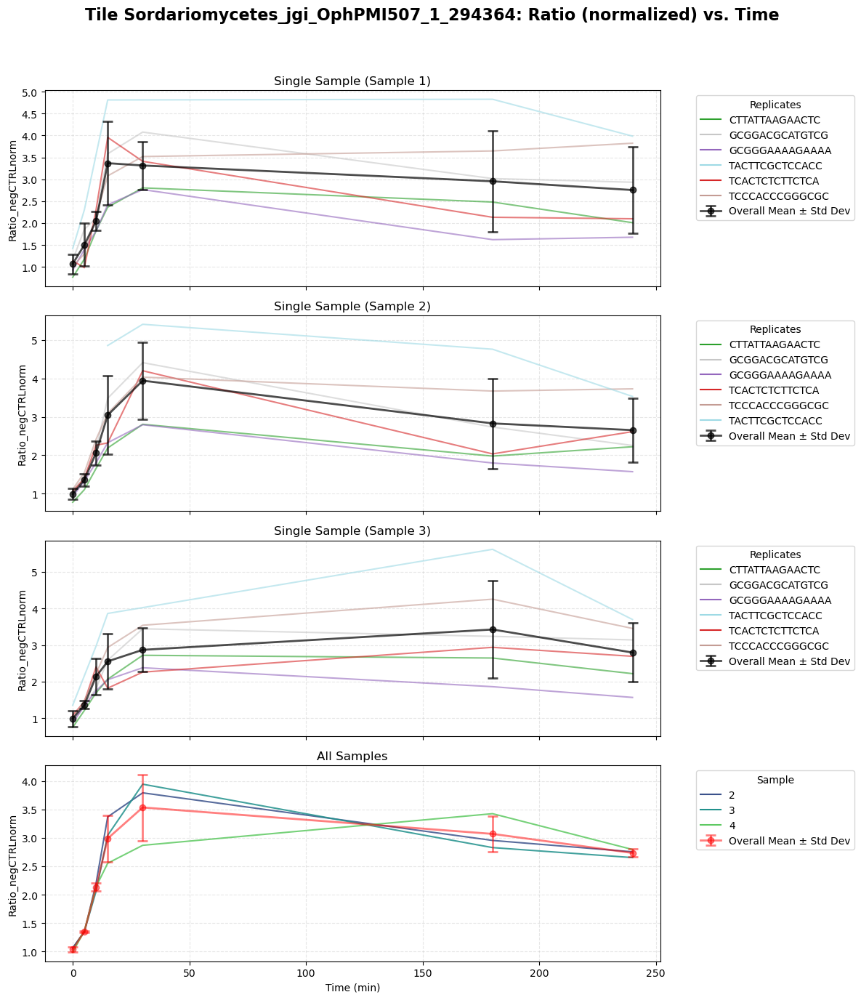

AGATTTACTCCACAACAATCTTCTATTCAACAATTCTATGCTTCTTCTGCTCCAAATTCTACTACTCATTTGCAACAAAGACAAACTAGACCACCAGTTCCACCATTCTCTCAATCTACT


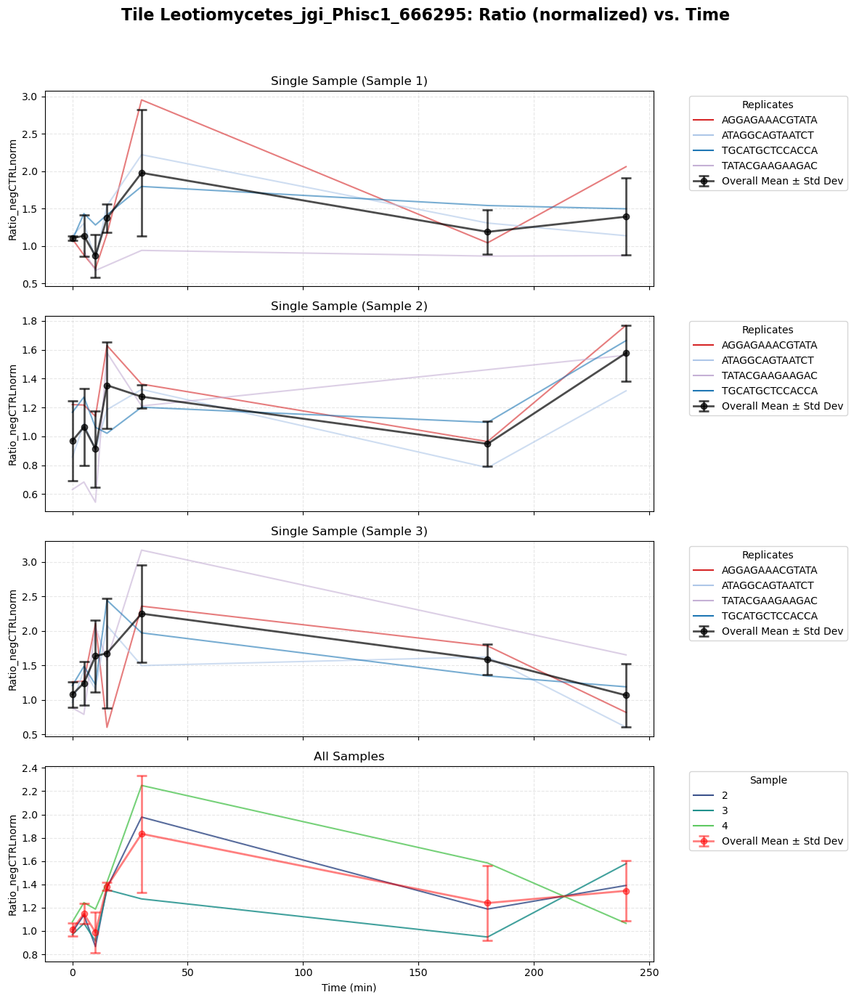

AATTATACTACTGCTTCTTCTTCTTCATTCTCTTCTGCTTCTGCTAATATCTTGCCAAGAGACTTCTCTGTCTTTACTACTGATTCTCAATCTTCTTGGTTGCCATCTTCTTCTCCATCT


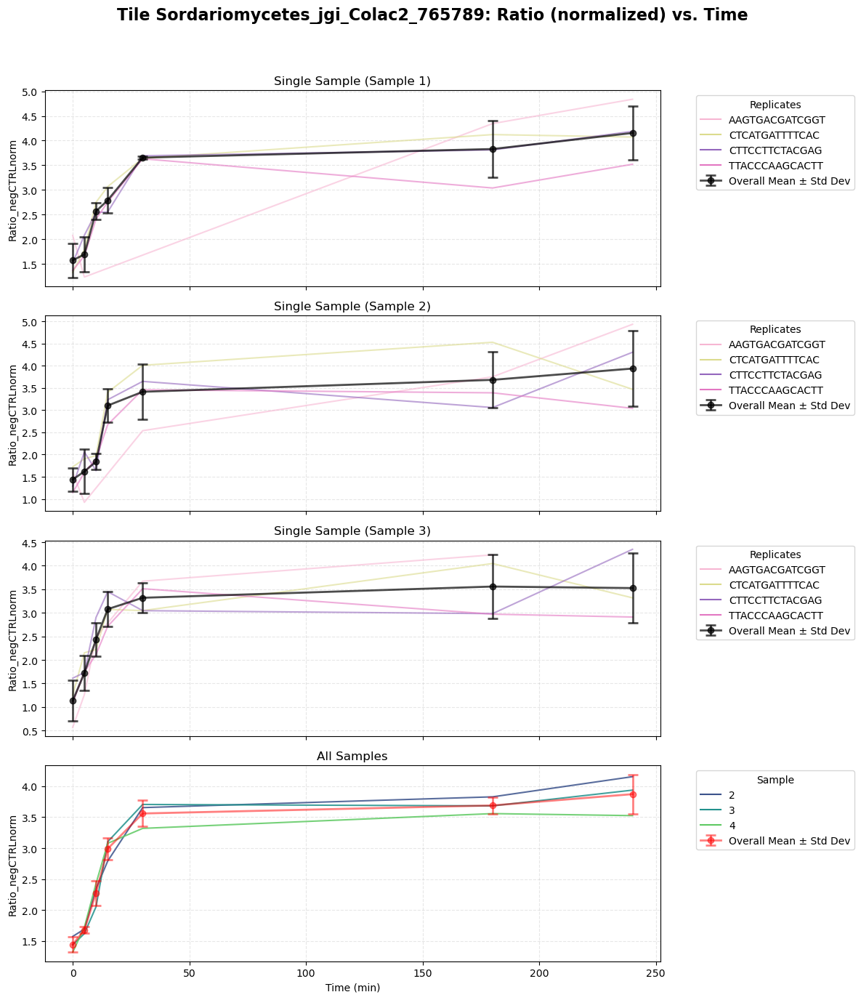

GCTTCTACTCCAGACTTTGCTAGATTGGATGATCCATCTGTTAGATTGCCAGATTCTGTTTCTGTTCCATTTGGTTCTGGTTCTACTCCATCTGCTTTGTTTCCTAAATCTTTGTTGTCT


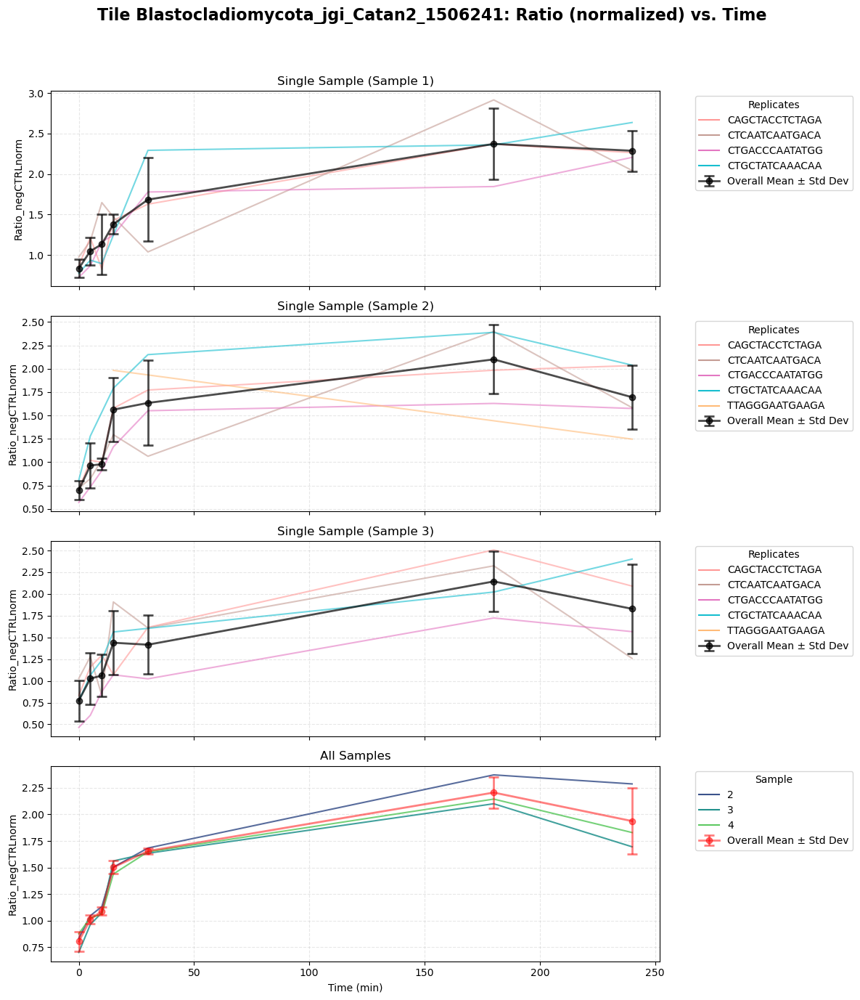

TCATTTACTACTGATAATTTGCAACAACCATGGTTGCCAACTCCACCACCACCACCACCATTGGCTCCACCAAATTCTACTTCTTCTGCTTCTTCTTCTTTGCCAGAAGACTTTGTCTTG


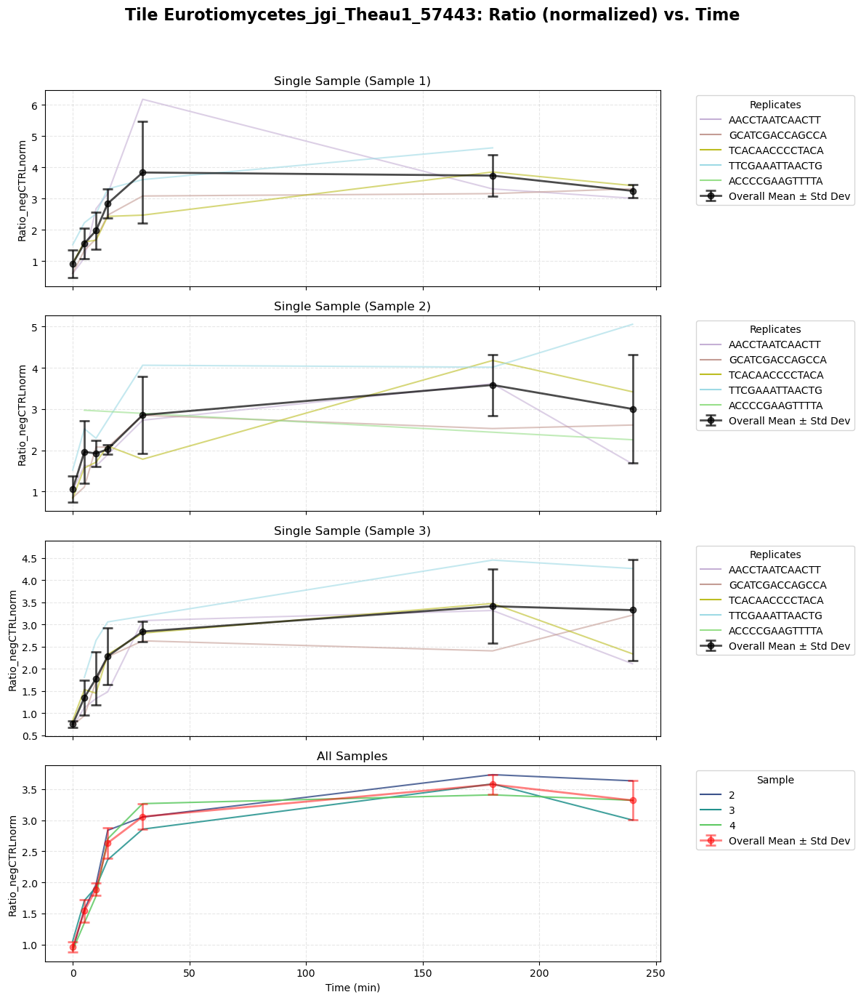

In [37]:
# Find the top 10 tiles with the most unique rptr barcodes
top_tiles_intersect = intersectiondf.groupby('Tile')['BCs'].nunique().reset_index()
top_tiles_sorted_intersect = top_tiles_intersect.sort_values('BCs', ascending=False)
top_10_tiles_intersect = top_tiles_sorted_intersect.head(10)['Tile']

mean_dict1 = {}
for t in top_10_tiles_intersect.to_list():
    print(t)
    name, mean = tile_and_replicate_hillfxn(t, 'Ratio_negCTRLnorm')
    mean_dict1[name] = mean 

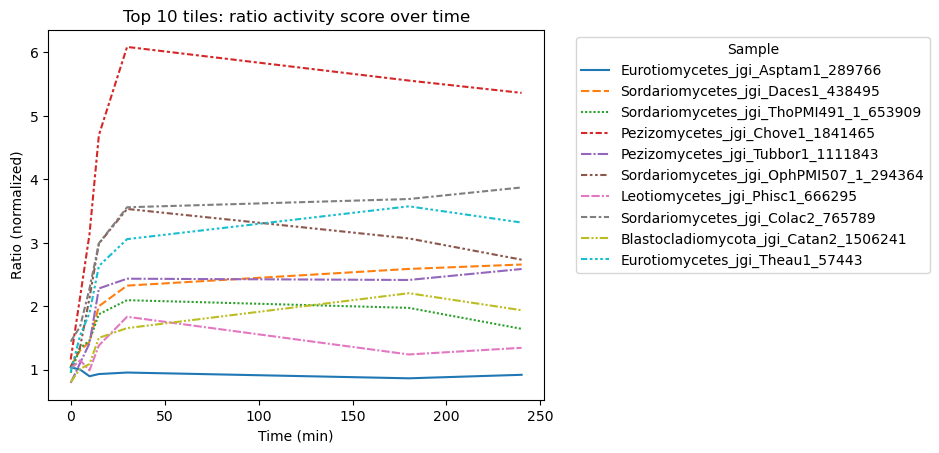

In [38]:
# Plot those top 10 in one plot
name_list1 = list(mean_dict1.keys())
mean_list1 = list(mean_dict1.values())
times_series= pd.Series([0,5,10,15,30, 180, 240])
df1 = pd.concat(mean_list1, axis=1,keys= name_list1)
df1 = df1.set_index(times_series)
# df.head()
sns.lineplot(data=df1)
plt.legend(title='Sample', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.ylabel('Ratio (normalized)')
plt.xlabel('Time (min)')
plt.title('Top 10 tiles: ratio activity score over time')
plt.show()

# Step 3.1: Trace QC

In [39]:
# check on AD stability

#FIX THIS

def AD_tile_and_replicate_hillfxn(tile, scoretype, outliers_removed=True, save_fig=False):
    """
    Generate subplots for:
    1. Ratio vs. Time for a single sample, showing individual replicates (BCs) with their mean and standard deviation.
    2. Ratio vs. Time for multiple samples, showing individual sample lines with overall mean and standard deviation.
    
    Parameters:
    tile (str): The tile to plot.
    outliers_removed (bool): Whether to remove outliers (based on IQR).
    """
    tiledf = intersectiondf.copy(deep=True)
    single_sample_df2 = tiledf[(tiledf['Tile'] == tile) & (tiledf['sample'] == '2')]
    # print(single_sample_df2.head())
    single_sample_df3 = tiledf[(tiledf['Tile'] == tile) & (tiledf['sample'] == '3')]
    single_sample_df4 = tiledf[(tiledf['Tile'] == tile) & (tiledf['sample'] == '4')]
    
    all_samples_df = tiledf[tiledf['Tile'] == tile]
    tile_name = next(iter(set(all_samples_df['Name'].to_list())))
    tile_name = "_".join(tile_name.split("|")[:3])
    
    if outliers_removed:
        single_sample_df2 = remove_outliers(single_sample_df2, group_col='Time', target_col=scoretype)
        single_sample_df3 = remove_outliers(single_sample_df3, group_col='Time', target_col=scoretype)
        single_sample_df4 = remove_outliers(single_sample_df4, group_col='Time', target_col=scoretype)
        all_samples_df = remove_outliers(all_samples_df, group_col='Time', target_col=scoretype)
    
    replicate_means2 = single_sample_df2.groupby(['Time', 'Tile-AD'])[scoretype].mean().reset_index()
    # print(replicate_means2)
    replicate_means3 = single_sample_df3.groupby(['Time', 'Tile-AD'])[scoretype].mean().reset_index()
    replicate_means4 = single_sample_df4.groupby(['Time', 'Tile-AD'])[scoretype].mean().reset_index()
    
    single_time_means2 = single_sample_df2.groupby('Time')[scoretype].agg(['mean', 'std']).reset_index()
    # print(single_time_means2)
    single_time_means3 = single_sample_df3.groupby('Time')[scoretype].agg(['mean', 'std']).reset_index()
    single_time_means4 = single_sample_df4.groupby('Time')[scoretype].agg(['mean', 'std']).reset_index()
    
    sample_means = all_samples_df.groupby(['Time', 'sample'])[scoretype].mean().reset_index()
    all_time_means = sample_means.groupby('Time')[scoretype].agg(['mean', 'std']).reset_index()
    
    unique_bcs = intersectiondf['Tile-AD'].unique()
    palette = sns.color_palette("tab20", len(unique_bcs))
    bc_color_map = dict(zip(unique_bcs, palette))
    
    fig, axes = plt.subplots(4, 1, figsize=(12, 14), sharex=True)
    fig.suptitle(f'Tile {tile_name}: Ratio (normalized) vs. Time', fontsize=16, fontweight='bold')
    
    for i, (replicate_means, single_time_means, title, ax) in enumerate(
        zip([replicate_means2, replicate_means3, replicate_means4],
            [single_time_means2, single_time_means3, single_time_means4],
            ['Single Sample (Sample 2)', 'Single Sample (Sample 3)', 'Single Sample (Sample 4)'],
            axes[:3])
    ):
        sns.lineplot(data=replicate_means, x='Time', y=scoretype, hue='Tile-AD', ax=ax, alpha=0.6, lw=1.5, palette=bc_color_map)
        ax.errorbar(single_time_means['Time'], single_time_means['mean'], yerr=single_time_means['std'], fmt='o-', capsize=5, capthick=2, color='black', label='Overall Mean ± Std Dev', lw=2, alpha=0.7)
        ax.set_title(title)
        ax.set_ylabel(f'{scoretype}')
        ax.set_xlabel('Time (min)')
        ax.legend(title='Replicates', bbox_to_anchor=(1.05, 1), loc='upper left')
        ax.grid(True, linestyle='--', alpha=0.3)
    
    sns.lineplot(data=sample_means, x='Time', y=scoretype, hue='sample', ax=axes[3], palette='viridis', alpha=0.85, lw=1.5)
    axes[3].errorbar(all_time_means['Time'], all_time_means['mean'], yerr=all_time_means['std'], fmt='o-', capsize=5, capthick=2, color='red', label='Overall Mean ± Std Dev', lw=2, alpha=0.5)
    axes[3].set_title('All Samples')
    axes[3].set_ylabel(f'{scoretype}')
    axes[3].set_xlabel('Time (min)')
    axes[3].legend(title='Sample', bbox_to_anchor=(1.05, 1), loc='upper left')
    axes[3].grid(True, linestyle='--', alpha=0.3)
    
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    if save_fig:
        plt.savefig(f'{tile_name}_{scoretype}_timeseries.pdf')
    plt.show()
    
    return tile_name, all_time_means['mean']


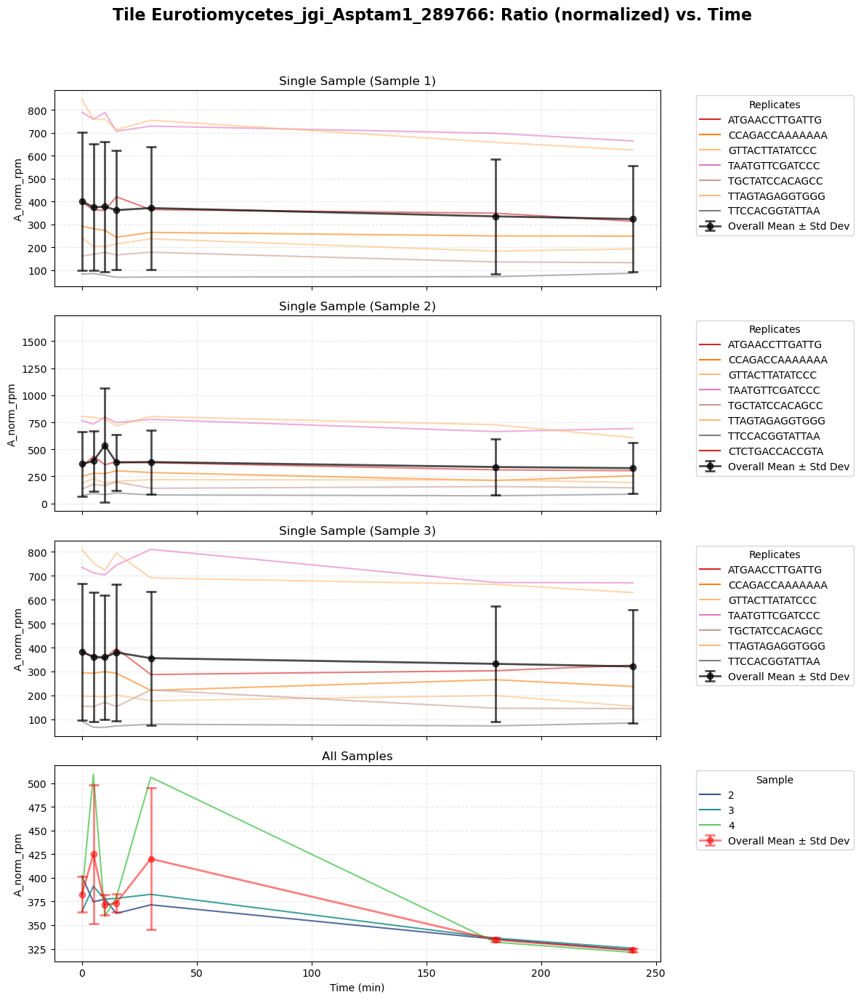

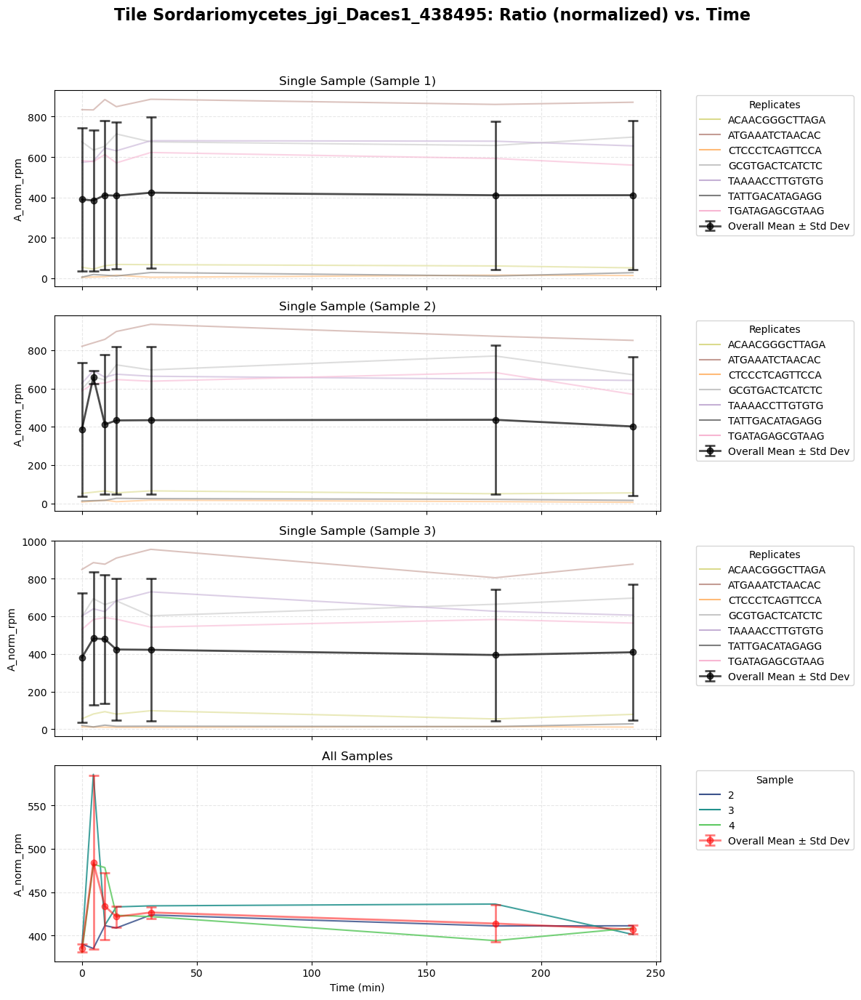

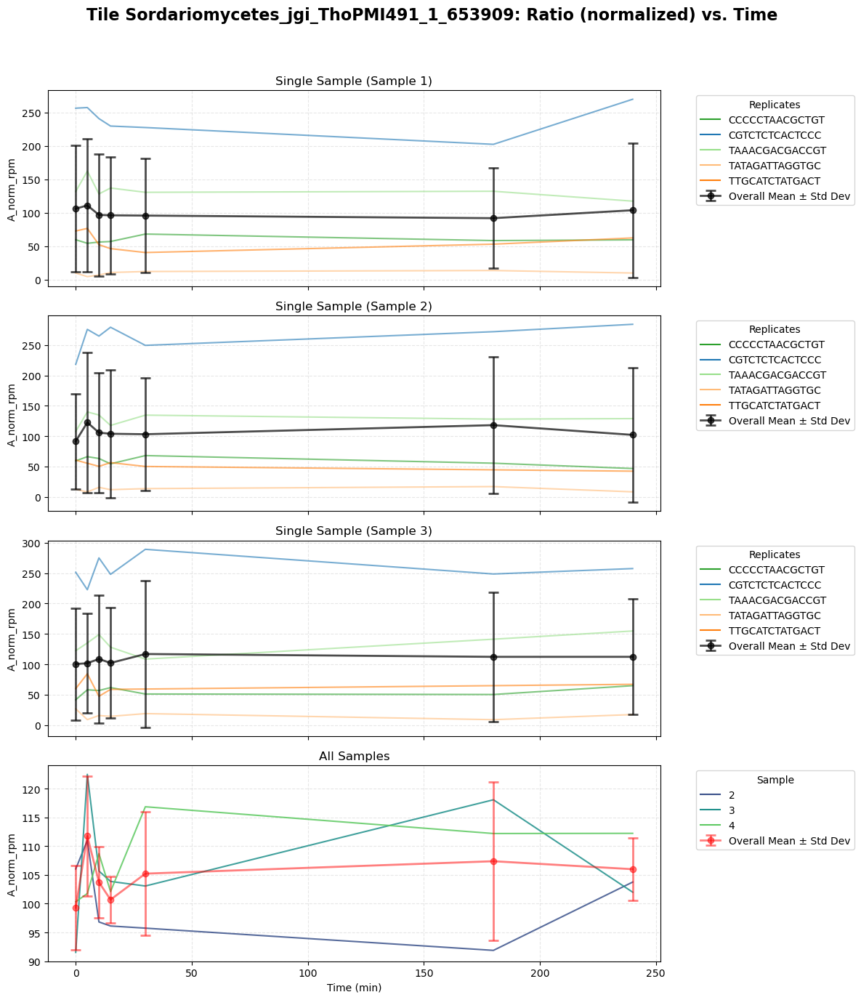

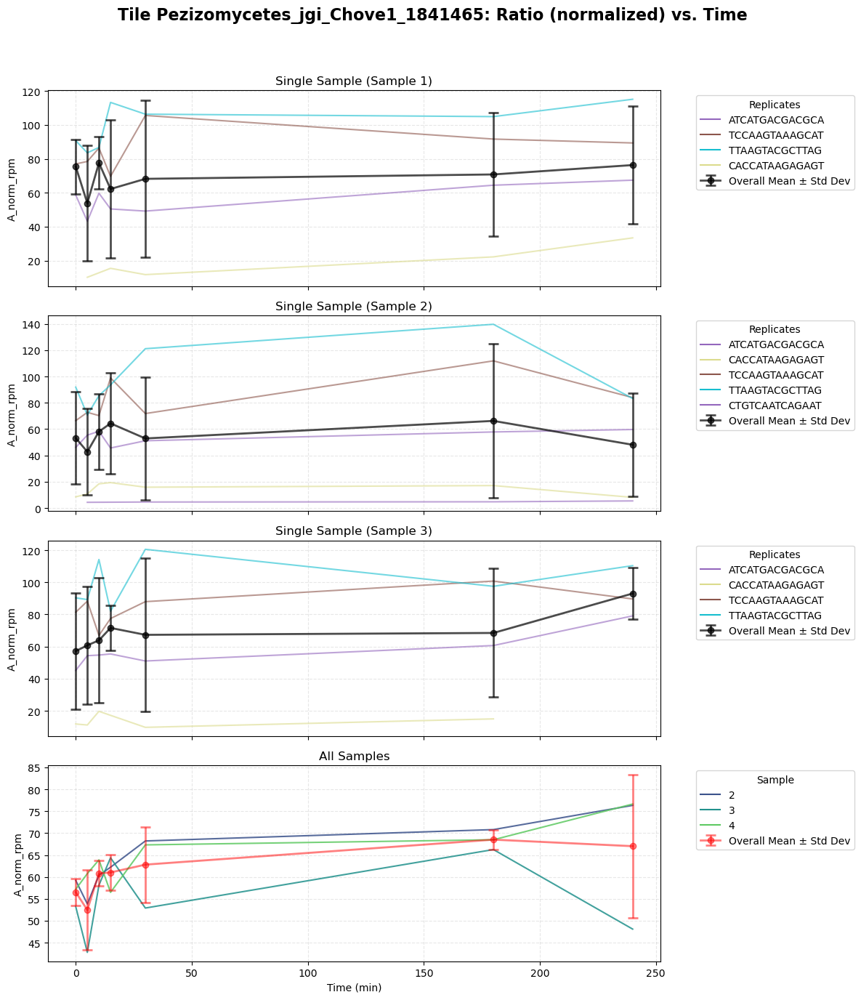

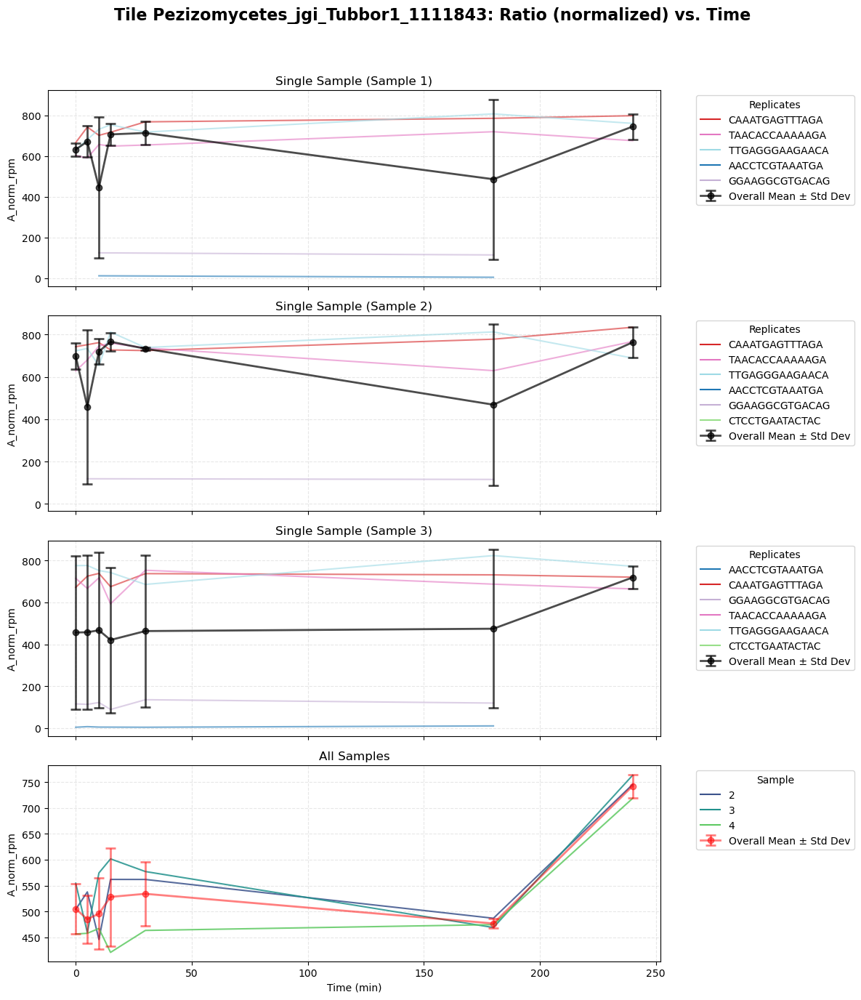

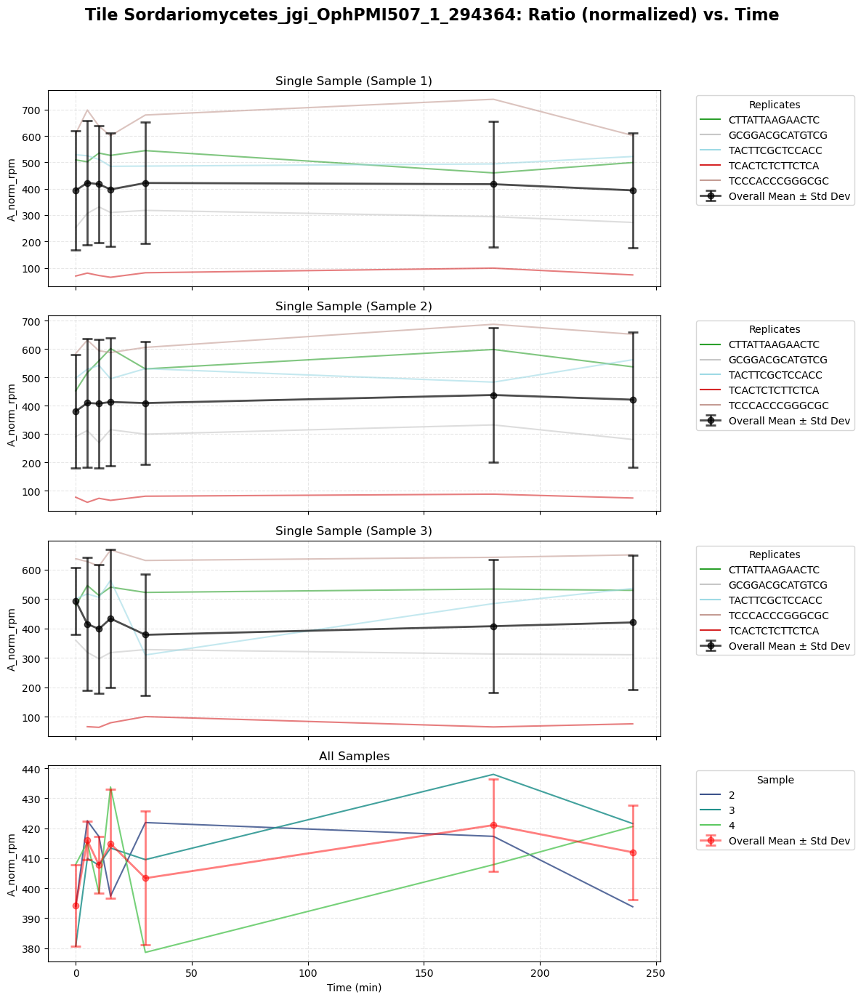

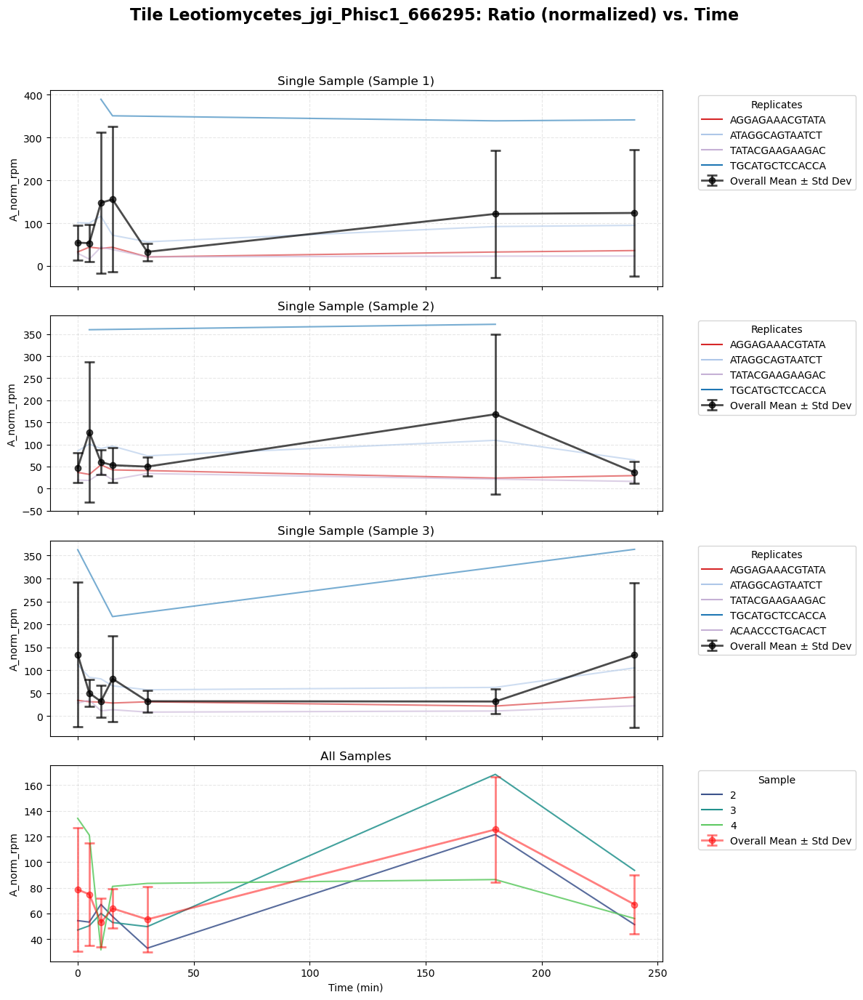

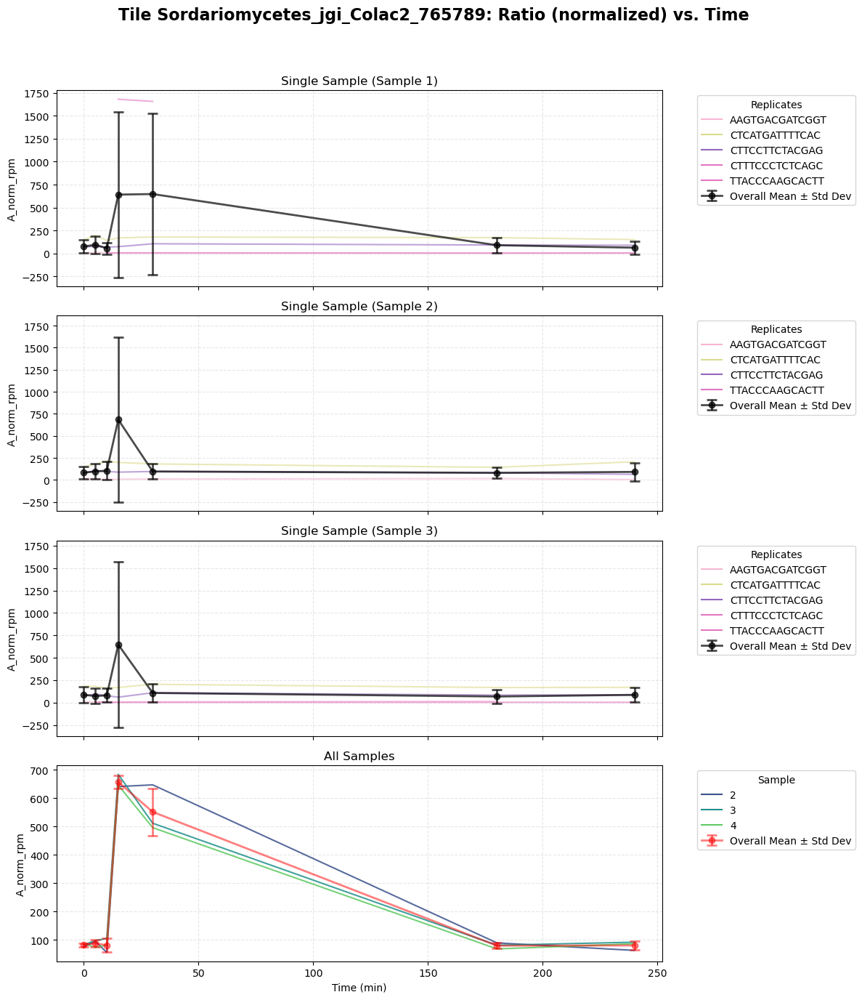

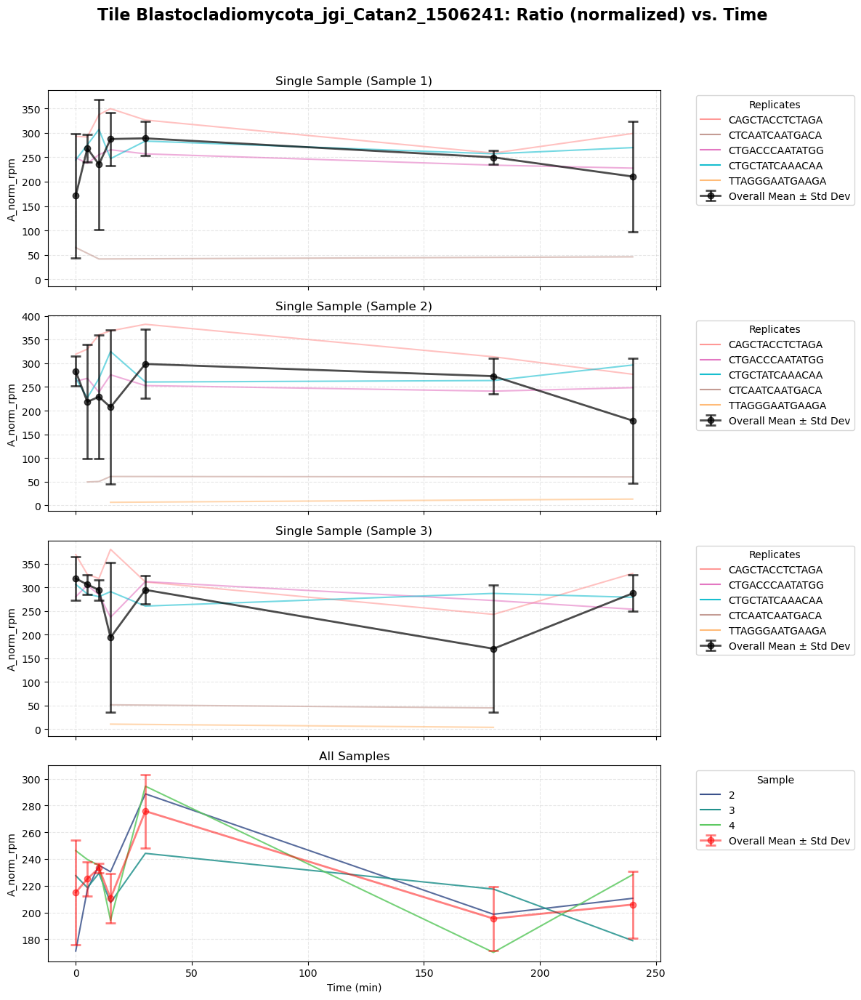

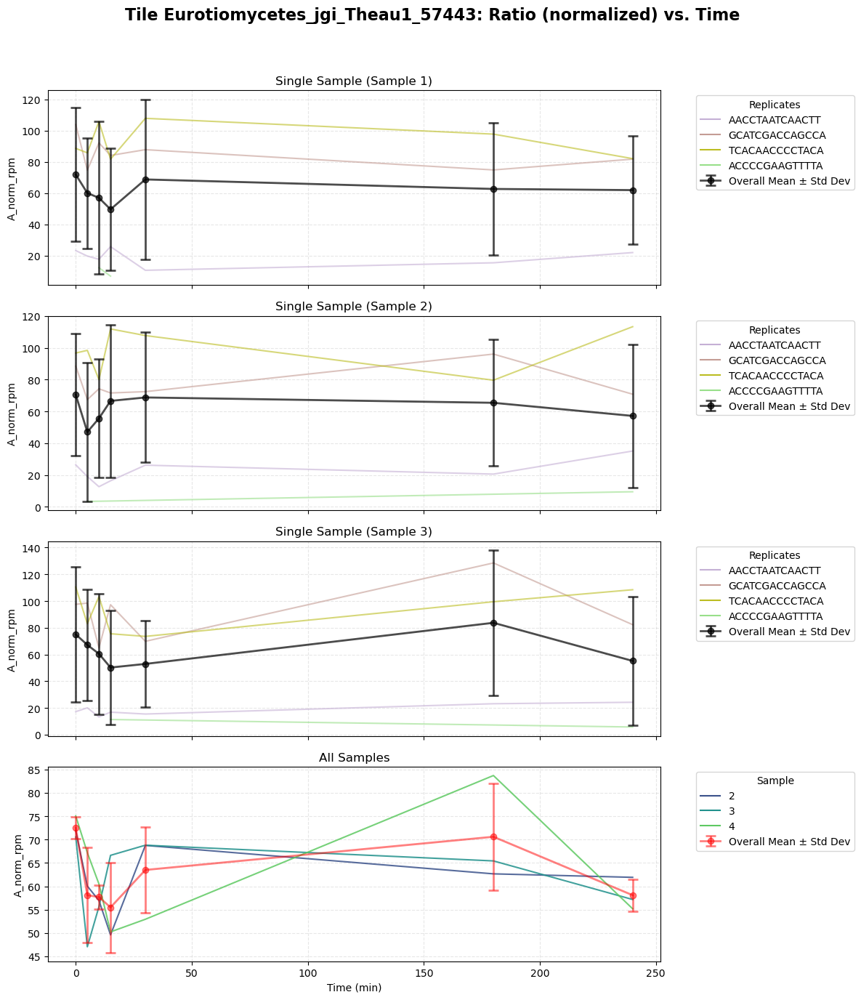

In [40]:
# Compare against what we ran in RPTR
for t in top_10_tiles_intersect.to_list():
    name, mean = tile_and_replicate_hillfxn(t, 'A_norm_rpm')

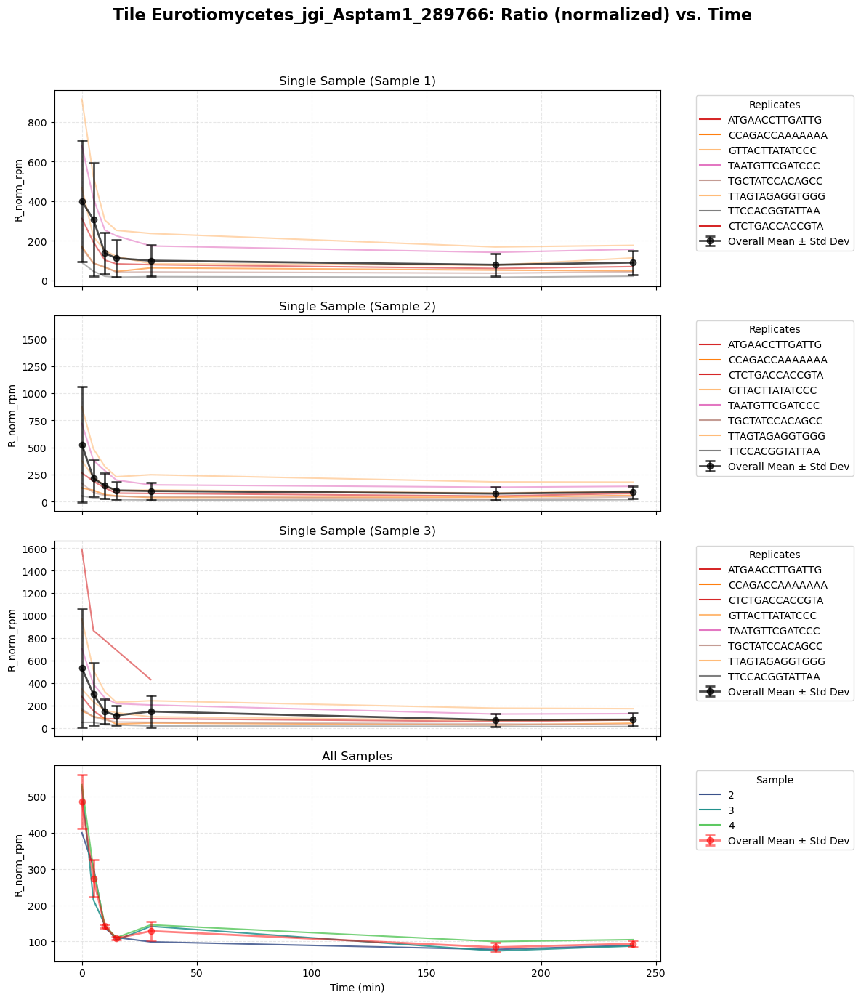

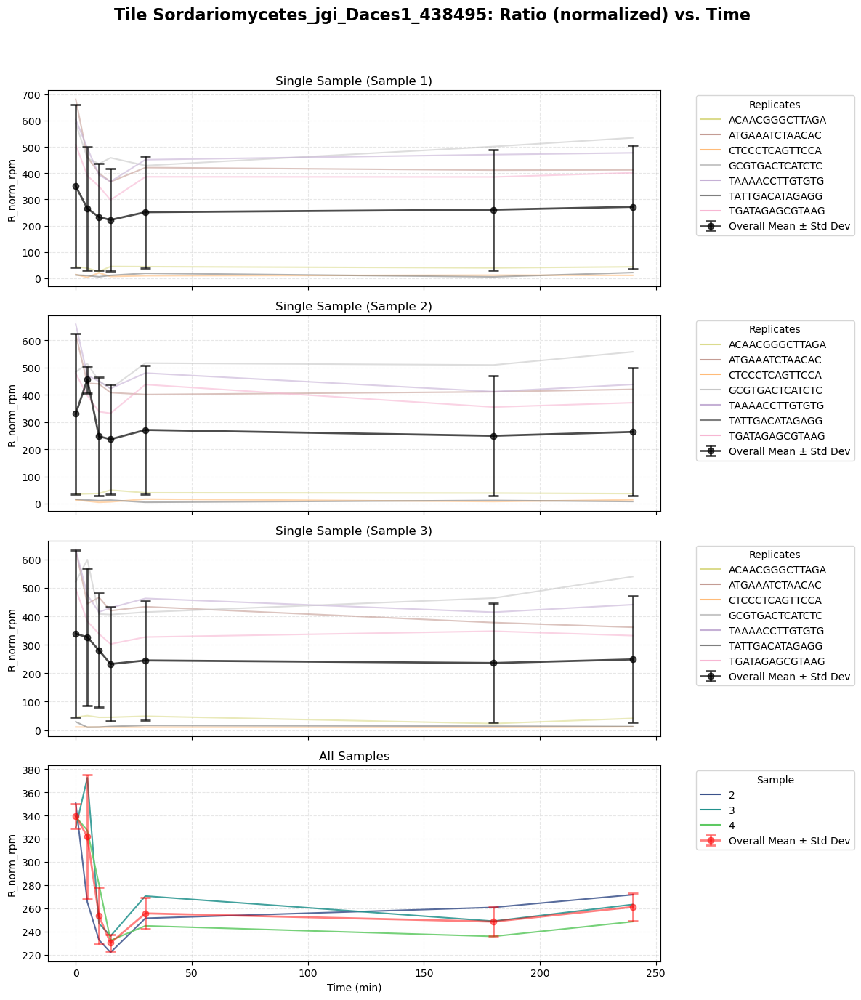

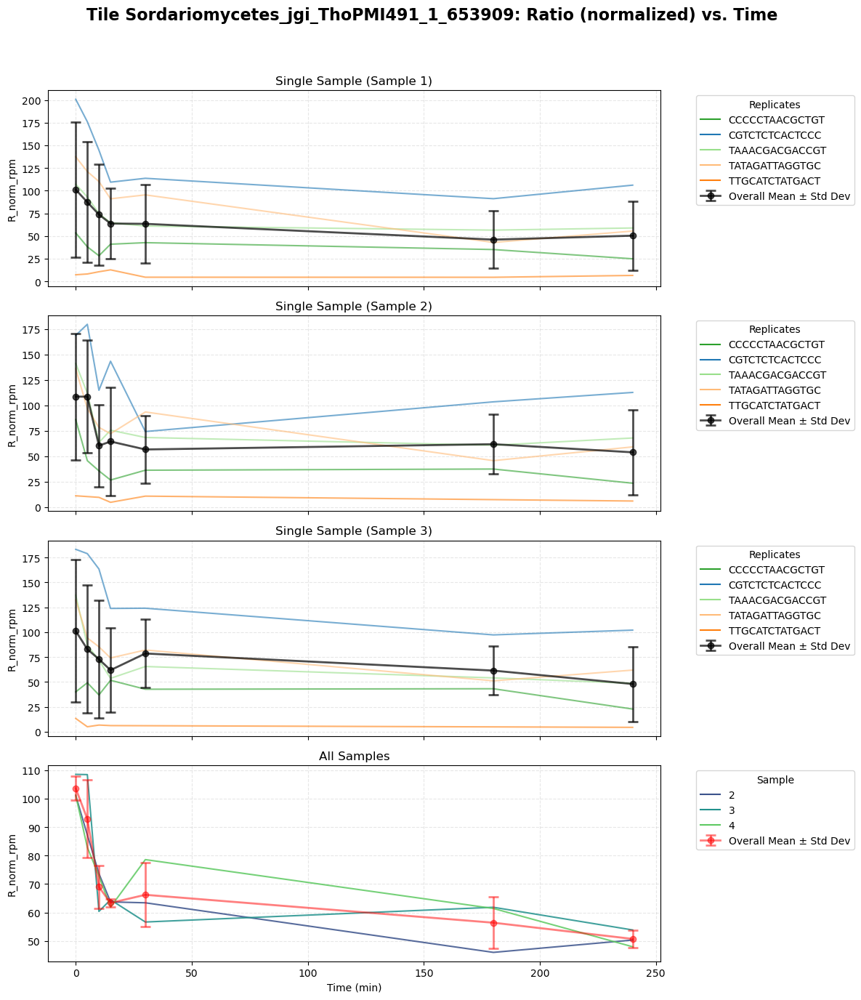

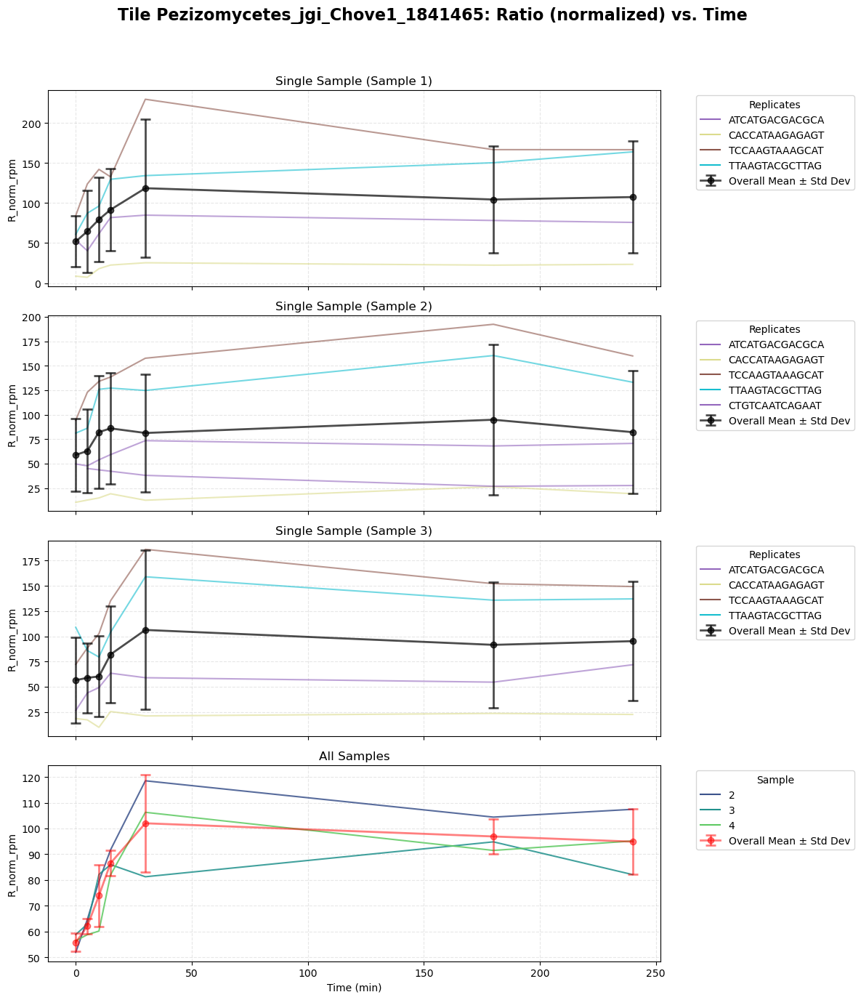

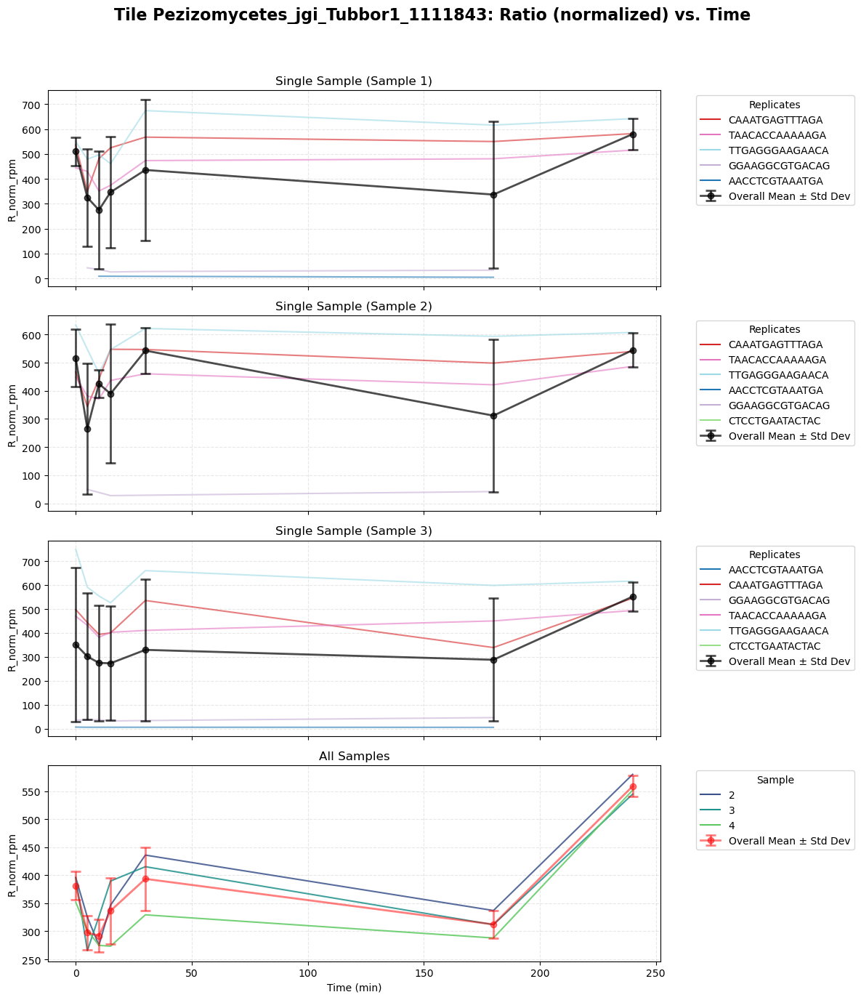

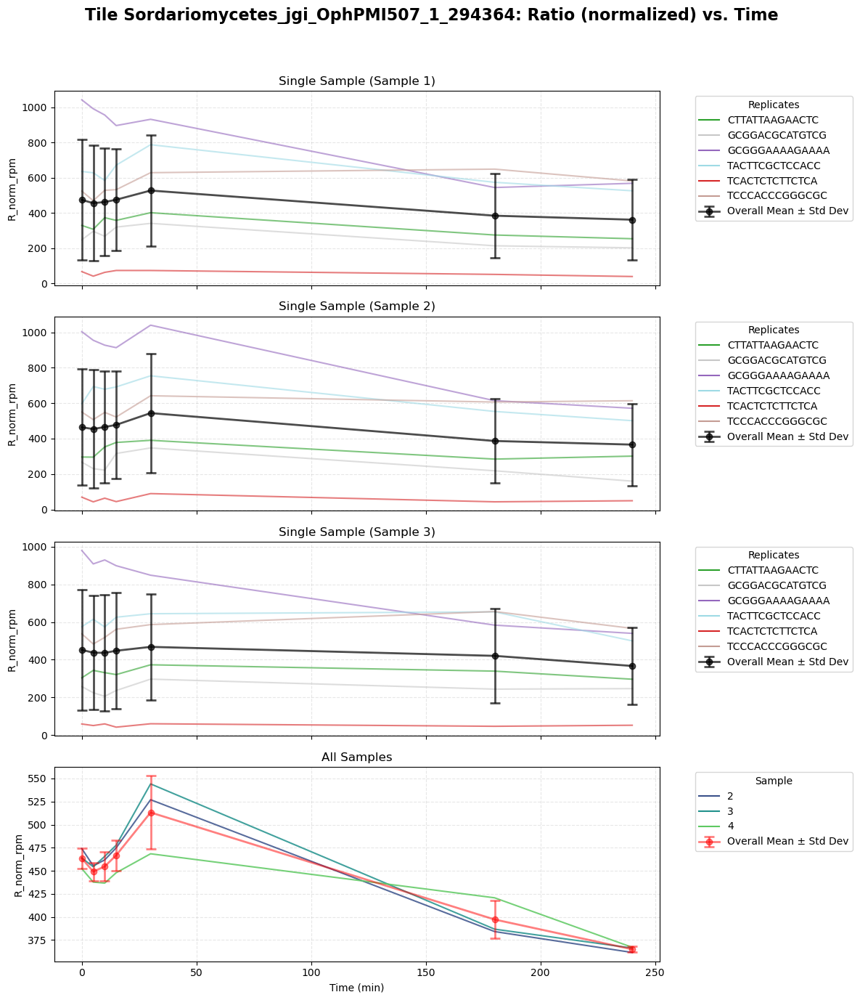

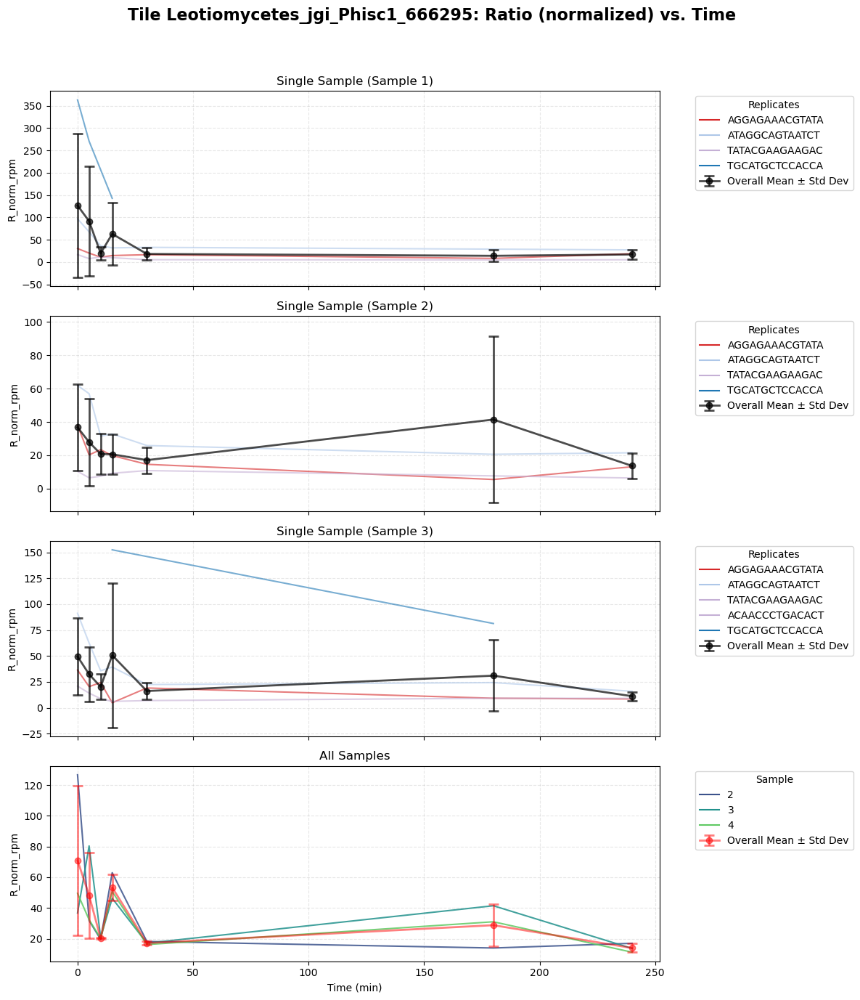

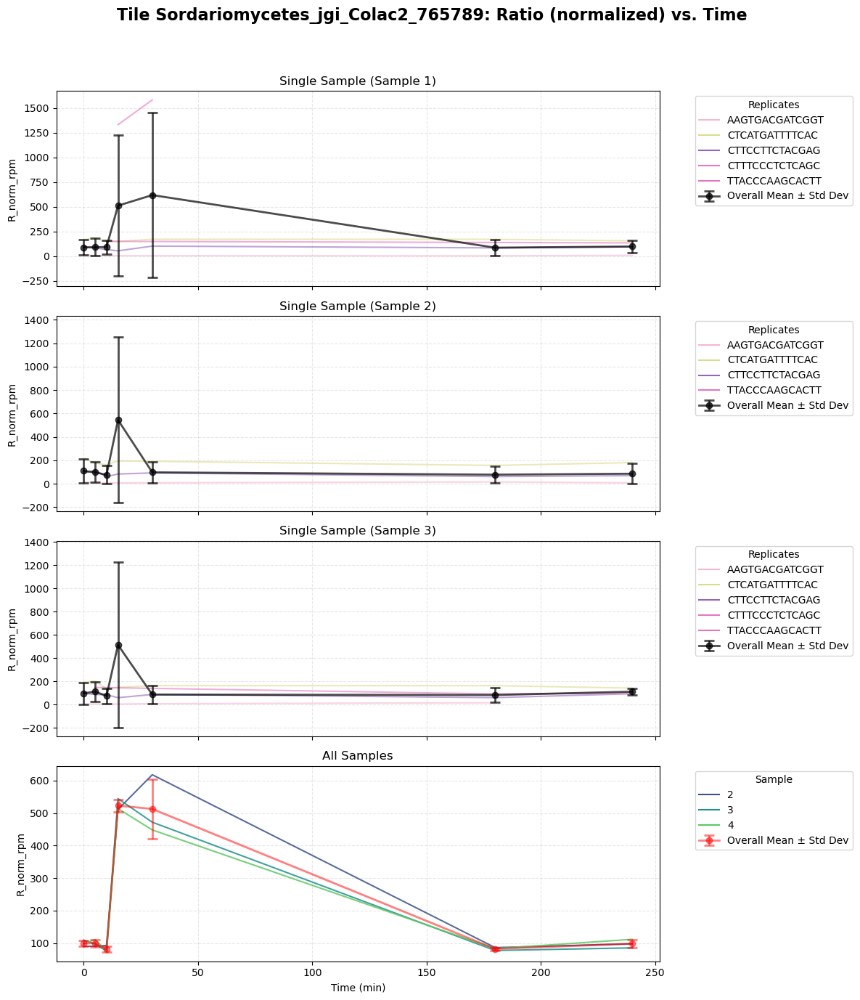

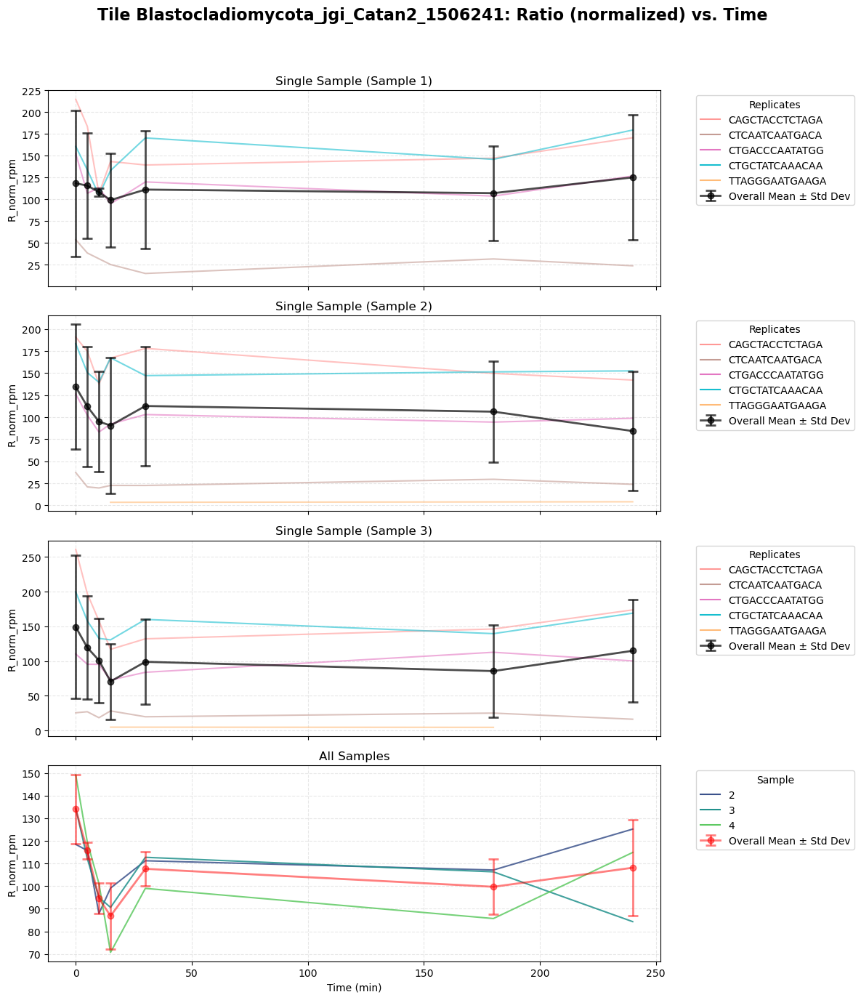

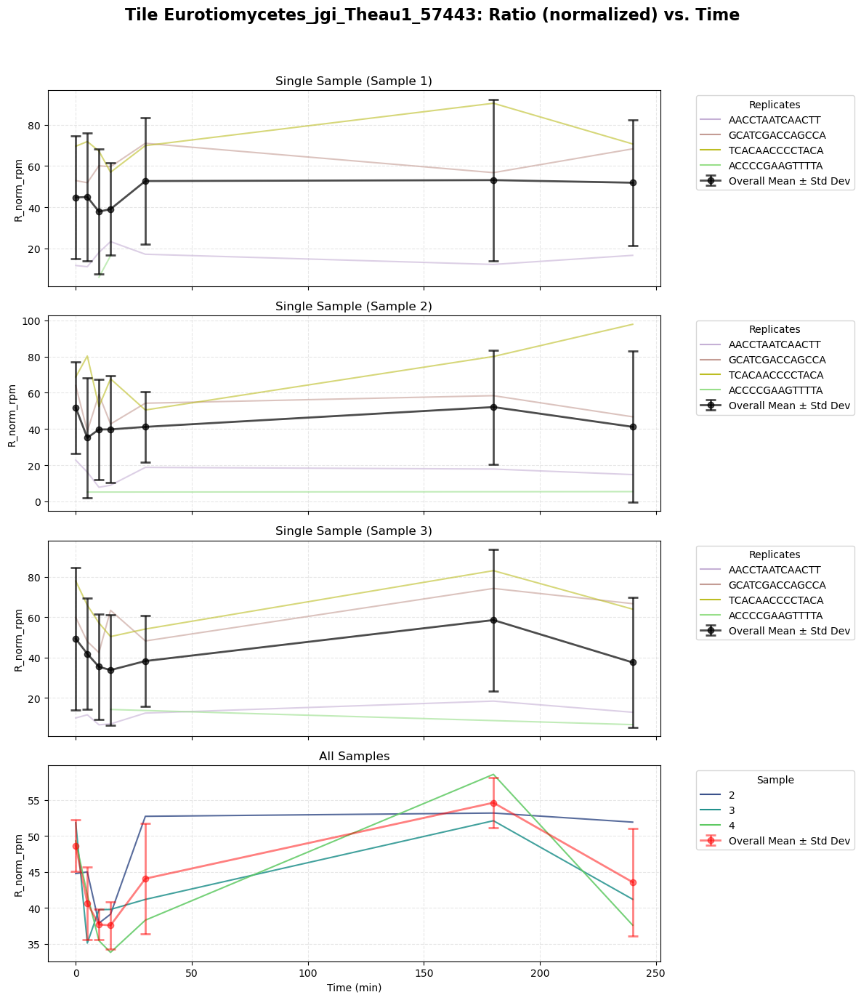

In [47]:
for t in top_10_tiles_intersect.to_list():
    name, mean = tile_and_replicate_hillfxn(t, 'R_norm_rpm')

# Step 4: T1/2 and Vmax
Note: this is the roughest analysis :)

In [48]:
def remove_outliers_fast(df, group_cols, value_col):
    """Remove outliers based on IQR efficiently without using apply"""
    # Compute Q1 and Q3 per group
    q1 = df.groupby(group_cols)[value_col].transform(lambda x: x.quantile(0.25))
    q3 = df.groupby(group_cols)[value_col].transform(lambda x: x.quantile(0.75))
    iqr = q3 - q1

    # Define outlier bounds
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr

    # Apply filtering in a vectorized manner
    return df[(df[value_col] >= lower_bound) & (df[value_col] <= upper_bound)]
    
def filter_by_maximum_threshold(df, threshold=5):
    """Keep tiles where max value is at least `threshold` units higher than value at time 0."""
    return df[(df.iloc[:,:7].max(axis=1) - df.iloc[:, 0]) >= threshold]

In [49]:
# Count occurrences of each (Tile, Time, Sample) combination
tile_time_sample_counts = concatenated_df.groupby('Tile')['sample'].nunique()
# Identify tiles that appear in all time points
valid_tiles = tile_time_sample_counts[tile_time_sample_counts==3].index
# Filter concatenated_df to only keep valid Tiles
filtered_cat_1 = concatenated_df[concatenated_df['Tile'].isin(valid_tiles)]
# Check how many tiles were removed
print(f"Original Tiles: {concatenated_df['Tile'].nunique()}, Filtered Tiles: {filtered_cat_1['Tile'].nunique()}")

# Remove outliers within each sample
filtered_cat_2 = remove_outliers_fast(filtered_cat_1, ['sample', 'Tile', 'Time'], 'Ratio_negCTRLnorm')

# Compute sample-level means
sample_means_cat = filtered_cat_2.groupby(['Tile', 'Time', 'sample'])['Ratio_negCTRLnorm'].mean().reset_index()

# Compute the mean across samples (not just raw mean)
final_means_cat = sample_means_cat.groupby(['Tile', 'Time'])['Ratio_negCTRLnorm'].mean().unstack(level='Time')

# Compute standard deviation across sample means
std_devs_cat = sample_means_cat.groupby(['Tile', 'Time'])['Ratio_negCTRLnorm'].std().unstack(level='Time')

# filter based on the difference between score at t=0 and Vmax
filtered_final_means_cat = filter_by_maximum_threshold(final_means_cat).dropna()

final_means_cat['Vmax'] = final_means_cat.max(axis=1)
final_means_cat['Avg_StdDev'] = std_devs_cat.mean(axis=1)


filtered_final_means_cat['Activity'] = 'active'

inactive = final_means_cat.copy(deep=True)
inactive = inactive.reset_index()
inactive = inactive[~inactive['Tile'].isin(list(filtered_final_means_cat.index))].dropna()
inactive['Activity'] = 'inactive'


# Display the result
filtered_final_means_cat


Original Tiles: 10499, Filtered Tiles: 10380


KeyboardInterrupt: 